# Creating new dataset

#International Labour Organization (ILO) dataset**

In [ ]:
import numpy as np
import pandas as pd
import matplotlib as plt
import joblib
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
df = pd.read_csv("/content/drive/MyDrive/ISO_unemployment.csv")
df

,ref_area.label,source.label,indicator.label,sex.label,classif1.label,time,obs_value
0,Aruba,LFS - Labour Force Survey,SDG indicator 8.5.2 - Unemployment rate (%),Sex: Total,"Age (Youth, adults): 15+",2011,8.900
1,Aruba,LFS - Labour Force Survey,SDG indicator 8.5.2 - Unemployment rate (%),Sex: Male,"Age (Youth, adults): 15+",2011,8.600
2,Aruba,LFS - Labour Force Survey,SDG indicator 8.5.2 - Unemployment rate (%),Sex: Female,"Age (Youth, adults): 15+",2011,7.800
3,Aruba,PC - Population and Housing Census,SDG indicator 8.5.2 - Unemployment rate (%),Sex: Total,"Age (Youth, adults): 15+",2010,10.600
4,Aruba,PC - Population and Housing Census,SDG indicator 8.5.2 - Unemployment rate (%),Sex: Total,"Age (Youth, adults): 15-24",2010,28.860
...,...,...,...,...,...,...,...
14555,Zimbabwe,LFS - Labour Force Survey,SDG indicator 8.5.2 - Unemployment rate (%),Sex: Male,"Age (Youth, adults): 15-24",2011,7.734
14556,Zimbabwe,LFS - Labour Force Survey,SDG indicator 8.5.2 - Unemployment rate (%),Sex: Male,"Age (Youth, adults): 25+",2011,3.359
14557,Zimbabwe,LFS - Labour Force Survey,SDG indicator 8.5.2 - Unemployment rate (%),Sex: Female,"Age (Youth, adults): 15+",2011,5.994
14558,Zimbabwe,LFS - Labour Force Survey,SDG indicator 8.5.2 - Unemployment rate (%),Sex: Female,"Age (Youth, adults): 15-24",2011,9.776


Drop the source and indicator columns because they are unimportant for our research.

In [ ]:
df.drop(['source.label','indicator.label'],axis=1, inplace=True)
df

,ref_area.label,sex.label,classif1.label,time,obs_value
0,Aruba,Sex: Total,"Age (Youth, adults): 15+",2011,8.900
1,Aruba,Sex: Male,"Age (Youth, adults): 15+",2011,8.600
2,Aruba,Sex: Female,"Age (Youth, adults): 15+",2011,7.800
3,Aruba,Sex: Total,"Age (Youth, adults): 15+",2010,10.600
4,Aruba,Sex: Total,"Age (Youth, adults): 15-24",2010,28.860
...,...,...,...,...,...
14555,Zimbabwe,Sex: Male,"Age (Youth, adults): 15-24",2011,7.734
14556,Zimbabwe,Sex: Male,"Age (Youth, adults): 25+",2011,3.359
14557,Zimbabwe,Sex: Female,"Age (Youth, adults): 15+",2011,5.994
14558,Zimbabwe,Sex: Female,"Age (Youth, adults): 15-24",2011,9.776


Rename ILO dataset columns to more usual columns names.

In [ ]:
df.rename(columns={'ref_area.label': 'Country','sex.label':'Sex','classif1.label':'Age','time':'Year','obs_value':'Rate'}, inplace=True)
df

,Country,Sex,Age,Year,Rate
0,Aruba,Sex: Total,"Age (Youth, adults): 15+",2011,8.900
1,Aruba,Sex: Male,"Age (Youth, adults): 15+",2011,8.600
2,Aruba,Sex: Female,"Age (Youth, adults): 15+",2011,7.800
3,Aruba,Sex: Total,"Age (Youth, adults): 15+",2010,10.600
4,Aruba,Sex: Total,"Age (Youth, adults): 15-24",2010,28.860
...,...,...,...,...,...
14555,Zimbabwe,Sex: Male,"Age (Youth, adults): 15-24",2011,7.734
14556,Zimbabwe,Sex: Male,"Age (Youth, adults): 25+",2011,3.359
14557,Zimbabwe,Sex: Female,"Age (Youth, adults): 15+",2011,5.994
14558,Zimbabwe,Sex: Female,"Age (Youth, adults): 15-24",2011,9.776


The age and sex column contains data in an inappropriate format, so we need to delete the information before the semicolon and keep only the numbers.

In [ ]:
df['Age'] = df['Age'].apply(lambda x: x.split(': ')[-1] if isinstance(x, str) else x)
df['Sex'] = df['Sex'].apply(lambda x: x.split(': ')[-1] if isinstance(x, str) else x)
df

,Country,Sex,Age,Year,Rate
0,Aruba,Total,15+,2011,8.900
1,Aruba,Male,15+,2011,8.600
2,Aruba,Female,15+,2011,7.800
3,Aruba,Total,15+,2010,10.600
4,Aruba,Total,15-24,2010,28.860
...,...,...,...,...,...
14555,Zimbabwe,Male,15-24,2011,7.734
14556,Zimbabwe,Male,25+,2011,3.359
14557,Zimbabwe,Female,15+,2011,5.994
14558,Zimbabwe,Female,15-24,2011,9.776


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14560 entries, 0 to 14559
Data columns (total 5 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   Country  14560 non-null  object 
 1   Sex      14560 non-null  object 
 2   Age      14560 non-null  object 
 3   Year     14560 non-null  int64  
 4   Rate     14507 non-null  float64
dtypes: float64(1), int64(1), object(3)
memory usage: 568.9+ KB


#Country-Continent dataset

**We need to add continent column for that we use kaggle dataset "Countries by Continent"**

In [ ]:
countries_continent= pd.read_csv("/content/drive/MyDrive/continents.csv")
countries_continent

,Entity,Code,Year,Continent
0,Abkhazia,OWID_ABK,2015,Asia
1,Afghanistan,AFG,2015,Asia
2,Akrotiri and Dhekelia,OWID_AKD,2015,Asia
3,Aland Islands,ALA,2015,Europe
4,Albania,ALB,2015,Europe
...,...,...,...,...
280,Yemen People's Republic,OWID_YPR,2015,Asia
281,Yugoslavia,OWID_YGS,2015,Europe
282,Zambia,ZMB,2015,Africa
283,Zanzibar,OWID_ZAN,2015,Africa


We are only interested in the Entity and Continent columns, so we don't need the Code and Year columns.

In [ ]:
countries_continent.drop(["Code", "Year"], axis=1, inplace=True)
countries_continent

,Entity,Continent
0,Abkhazia,Asia
1,Afghanistan,Asia
2,Akrotiri and Dhekelia,Asia
3,Aland Islands,Europe
4,Albania,Europe
...,...,...
280,Yemen People's Republic,Asia
281,Yugoslavia,Europe
282,Zambia,Africa
283,Zanzibar,Africa


In [ ]:
countries_continent.rename(columns={"Entity":"Country"}, inplace=True)

In [ ]:
print(countries_continent.columns)

Index(['Country', 'Continent'], dtype='object')


# Global Unemployment Rate Dataset

In [ ]:
global_dataset = pd.read_csv("/content/drive/MyDrive/global_unemployment_data.csv")
global_dataset

,country_name,indicator_name,sex,age_group,age_categories,2014,2015,2016,2017,2018,2019,2020,2021,2022,2023,2024
0,Afghanistan,Unemployment rate by sex and age,Female,15-24,Youth,13.340,15.974,18.570,21.137,20.649,20.154,21.228,21.640,30.561,32.200,33.332
1,Afghanistan,Unemployment rate by sex and age,Female,25+,Adults,8.576,9.014,9.463,9.920,11.223,12.587,14.079,14.415,23.818,26.192,28.298
2,Afghanistan,Unemployment rate by sex and age,Female,Under 15,Children,10.306,11.552,12.789,14.017,14.706,15.418,16.783,17.134,26.746,29.193,30.956
3,Afghanistan,Unemployment rate by sex and age,Male,15-24,Youth,9.206,11.502,13.772,16.027,15.199,14.361,14.452,15.099,16.655,18.512,19.770
4,Afghanistan,Unemployment rate by sex and age,Male,25+,Adults,6.463,6.879,7.301,7.728,7.833,7.961,8.732,9.199,11.357,12.327,13.087
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1129,Zimbabwe,Unemployment rate by sex and age,Female,25+,Adults,4.262,4.586,4.773,4.900,5.027,5.309,6.345,7.792,7.704,7.597,7.528
1130,Zimbabwe,Unemployment rate by sex and age,Female,Under 15,Children,5.174,5.666,6.014,6.289,6.555,6.990,8.494,9.853,9.670,9.518,9.414
1131,Zimbabwe,Unemployment rate by sex and age,Male,15-24,Youth,6.007,7.131,8.119,9.029,9.927,11.048,13.191,14.261,13.966,13.675,13.485
1132,Zimbabwe,Unemployment rate by sex and age,Male,25+,Adults,3.677,4.325,4.843,5.287,5.722,6.362,6.996,7.234,6.858,6.757,6.703


The indicator_name column doesn't provide useful information, as it is the same for all data samples. Therefore, it can be removed.

In [ ]:
global_dataset.drop(["indicator_name"],axis=1,inplace=True)

Rename the column names to more basic and clear names.

In [ ]:
global_dataset.rename(columns={'country_name': 'Country','sex':'Sex','age_group':'Age'}, inplace=True)
global_dataset

,Country,Sex,Age,age_categories,2014,2015,2016,2017,2018,2019,2020,2021,2022,2023,2024
0,Afghanistan,Female,15-24,Youth,13.340,15.974,18.570,21.137,20.649,20.154,21.228,21.640,30.561,32.200,33.332
1,Afghanistan,Female,25+,Adults,8.576,9.014,9.463,9.920,11.223,12.587,14.079,14.415,23.818,26.192,28.298
2,Afghanistan,Female,Under 15,Children,10.306,11.552,12.789,14.017,14.706,15.418,16.783,17.134,26.746,29.193,30.956
3,Afghanistan,Male,15-24,Youth,9.206,11.502,13.772,16.027,15.199,14.361,14.452,15.099,16.655,18.512,19.770
4,Afghanistan,Male,25+,Adults,6.463,6.879,7.301,7.728,7.833,7.961,8.732,9.199,11.357,12.327,13.087
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1129,Zimbabwe,Female,25+,Adults,4.262,4.586,4.773,4.900,5.027,5.309,6.345,7.792,7.704,7.597,7.528
1130,Zimbabwe,Female,Under 15,Children,5.174,5.666,6.014,6.289,6.555,6.990,8.494,9.853,9.670,9.518,9.414
1131,Zimbabwe,Male,15-24,Youth,6.007,7.131,8.119,9.029,9.927,11.048,13.191,14.261,13.966,13.675,13.485
1132,Zimbabwe,Male,25+,Adults,3.677,4.325,4.843,5.287,5.722,6.362,6.996,7.234,6.858,6.757,6.703


##Add total option to sex column

Now we need to add information about 'Total Sex' to the Global Unemployment Dataset, but we should only select records where the age is not '15+'. In the original dataset, we don't have this category, and we consider '15+' as adults, so it doesn't need to be included here.

In [ ]:
df_total = df[(df['Sex'] == 'Total') & (df['Age'] != '15+') & (df['Year']>=2014) ].copy()
df_total

,Country,Sex,Age,Year,Rate
13,Afghanistan,Total,15-24,2021,8.784
14,Afghanistan,Total,25+,2021,4.516
22,Afghanistan,Total,15-24,2020,16.200
23,Afghanistan,Total,25+,2020,9.792
31,Afghanistan,Total,15-24,2017,17.574
...,...,...,...,...,...
14526,Zimbabwe,Total,25+,2021,7.682
14534,Zimbabwe,Total,15-24,2019,11.856
14535,Zimbabwe,Total,25+,2019,5.929
14543,Zimbabwe,Total,15-24,2014,6.830


In [ ]:
pivot_df = df_total.pivot(index=['Country', 'Sex', 'Age'], columns='Year', values='Rate')
pivot_df = pivot_df.reset_index()
pivot_df

Year,Country,Sex,Age,2014,2015,2016,2017,2018,2019,2020,2021,2022,2023
0,Afghanistan,Total,15-24,9.963,NaN,NaN,17.574,NaN,NaN,16.200,8.784,NaN,NaN
1,Afghanistan,Total,25+,6.773,NaN,NaN,8.318,NaN,NaN,9.792,4.516,NaN,NaN
2,Albania,Total,15-24,39.869,39.977,36.613,31.610,28.127,26.977,NaN,27.069,NaN,NaN
3,Albania,Total,25+,15.227,14.198,12.964,11.588,10.195,9.474,NaN,9.648,NaN,NaN
4,Algeria,Total,15-24,25.027,29.839,25.716,29.020,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...
368,Yemen,Total,25+,9.490,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
369,Zambia,Total,15-24,NaN,30.909,NaN,8.384,8.731,10.308,11.010,9.306,9.816,NaN
370,Zambia,Total,25+,NaN,7.636,NaN,3.317,3.970,4.149,4.504,3.948,4.943,NaN
371,Zimbabwe,Total,15-24,6.830,NaN,NaN,NaN,NaN,11.856,NaN,15.466,17.490,NaN


We reshaped df_total by creating a pivot table that organizes unemployment rates (Rate) by country, sex, and age for each year. It then resets the index to convert it back to regular columns, resulting in a more structured DataFrame (pivot_df).

In [ ]:
age_categories_map = {
    '15-24': 'Youth',
    '25+': 'Adults',
    'Under 15': 'Children',
}

pivot_df['age_categories'] = pivot_df['Age'].map(age_categories_map)
pivot_df

Year,Country,Sex,Age,2014,2015,2016,2017,2018,2019,2020,2021,2022,2023,age_categories
0,Afghanistan,Total,15-24,9.963,NaN,NaN,17.574,NaN,NaN,16.200,8.784,NaN,NaN,Youth
1,Afghanistan,Total,25+,6.773,NaN,NaN,8.318,NaN,NaN,9.792,4.516,NaN,NaN,Adults
2,Albania,Total,15-24,39.869,39.977,36.613,31.610,28.127,26.977,NaN,27.069,NaN,NaN,Youth
3,Albania,Total,25+,15.227,14.198,12.964,11.588,10.195,9.474,NaN,9.648,NaN,NaN,Adults
4,Algeria,Total,15-24,25.027,29.839,25.716,29.020,NaN,NaN,NaN,NaN,NaN,NaN,Youth
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
368,Yemen,Total,25+,9.490,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Adults
369,Zambia,Total,15-24,NaN,30.909,NaN,8.384,8.731,10.308,11.010,9.306,9.816,NaN,Youth
370,Zambia,Total,25+,NaN,7.636,NaN,3.317,3.970,4.149,4.504,3.948,4.943,NaN,Adults
371,Zimbabwe,Total,15-24,6.830,NaN,NaN,NaN,NaN,11.856,NaN,15.466,17.490,NaN,Youth


We needed to create a dictionary called age_categories_map that categorizes age groups into 'Youth', 'Adults', and 'Children'. It then adds a new column, age_categories, to pivot_df by mapping the values in the 'Age' column to their corresponding categories based on the dictionary

The order is different from the initial dataset, so we will change it.

In [ ]:
pivot_df.columns = pivot_df.columns.map(str)
pivot_df['2024'] = np.nan
order = ['Country', 'Sex', 'Age', 'age_categories',
                    '2014', '2015', '2016', '2017', '2018', '2019', '2020', '2021', '2022', '2023','2024']
df_total_updated = pivot_df[order]

df_total_updated

Year,Country,Sex,Age,age_categories,2014,2015,2016,2017,2018,2019,2020,2021,2022,2023,2024
0,Afghanistan,Total,15-24,Youth,9.963,NaN,NaN,17.574,NaN,NaN,16.200,8.784,NaN,NaN,NaN
1,Afghanistan,Total,25+,Adults,6.773,NaN,NaN,8.318,NaN,NaN,9.792,4.516,NaN,NaN,NaN
2,Albania,Total,15-24,Youth,39.869,39.977,36.613,31.610,28.127,26.977,NaN,27.069,NaN,NaN,NaN
3,Albania,Total,25+,Adults,15.227,14.198,12.964,11.588,10.195,9.474,NaN,9.648,NaN,NaN,NaN
4,Algeria,Total,15-24,Youth,25.027,29.839,25.716,29.020,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
368,Yemen,Total,25+,Adults,9.490,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
369,Zambia,Total,15-24,Youth,NaN,30.909,NaN,8.384,8.731,10.308,11.010,9.306,9.816,NaN,NaN
370,Zambia,Total,25+,Adults,NaN,7.636,NaN,3.317,3.970,4.149,4.504,3.948,4.943,NaN,NaN
371,Zimbabwe,Total,15-24,Youth,6.830,NaN,NaN,NaN,NaN,11.856,NaN,15.466,17.490,NaN,NaN


Finally, we can combine the dataset with Female/Male and the dataset with Total Sex.

In [ ]:
global_dataset = pd.concat([global_dataset, df_total_updated], ignore_index=True)
global_dataset = global_dataset[order]
global_dataset

,Country,Sex,Age,age_categories,2014,2015,2016,2017,2018,2019,2020,2021,2022,2023,2024
0,Afghanistan,Female,15-24,Youth,13.340,15.974,18.570,21.137,20.649,20.154,21.228,21.640,30.561,32.200,33.332
1,Afghanistan,Female,25+,Adults,8.576,9.014,9.463,9.920,11.223,12.587,14.079,14.415,23.818,26.192,28.298
2,Afghanistan,Female,Under 15,Children,10.306,11.552,12.789,14.017,14.706,15.418,16.783,17.134,26.746,29.193,30.956
3,Afghanistan,Male,15-24,Youth,9.206,11.502,13.772,16.027,15.199,14.361,14.452,15.099,16.655,18.512,19.770
4,Afghanistan,Male,25+,Adults,6.463,6.879,7.301,7.728,7.833,7.961,8.732,9.199,11.357,12.327,13.087
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1502,Yemen,Total,25+,Adults,9.490,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1503,Zambia,Total,15-24,Youth,NaN,30.909,NaN,8.384,8.731,10.308,11.010,9.306,9.816,NaN,NaN
1504,Zambia,Total,25+,Adults,NaN,7.636,NaN,3.317,3.970,4.149,4.504,3.948,4.943,NaN,NaN
1505,Zimbabwe,Total,15-24,Youth,6.830,NaN,NaN,NaN,NaN,11.856,NaN,15.466,17.490,NaN,NaN


##Merge Global Unemployment Dataset with Country-Continents dataset

As we can see, we have our combined dataset, and we need to add a new column 'Continent' using the Kaggle dataset 'Country-Continents' that was imported earlier. However, we need to check for differences in the country names before proceeding.

In [ ]:
unique_df1 = set(global_dataset['Country'].unique())
unique_df2 = set(countries_continent['Country'].unique())
countries_in_df1_not = unique_df1 - unique_df2

print("Країни в df1, але немає в df2:")
print(np.array(list(countries_in_df1_not)))

Країни в df1, але немає в df2:
['United Kingdom of Great Britain and Northern Ireland' 'Türkiye'
 'Venezuela (Bolivarian Republic of)' 'Bolivia (Plurinational State of)'
 'Tanzania, United Republic of' 'Curaçao' 'Macau, China' 'Taiwan, China'
 'Russian Federation' 'Occupied Palestinian Territory'
 'Micronesia (Federated States of)' 'Congo, Democratic Republic of the'
 'Macao, China' "Korea, Democratic People's Republic of"
 'Republic of Moldova' 'Brunei Darussalam' 'Korea, Republic of'
 "Côte d'Ivoire" 'Iran (Islamic Republic of)' 'Hong Kong, China'
 "Lao People's Democratic Republic" 'Palestinian Territories'
 'Iran, Islamic Republic of' 'Cabo Verde' 'United States of America'
 'Viet Nam' 'Réunion' 'Moldova, Republic of' 'Syrian Arab Republic'
 'Republic of Korea' 'Timor-Leste' 'Ivory Coast'
 'Falkland Islands, Malvinas' 'Venezuela, Bolivarian Republic of'
 'South America']


This occurred due to different interpretations of country names, so we need to standardize the names to a single format in order to accurately determine the corresponding continent. So we rename some countries.

In [ ]:
global_dataset['Country'].replace('Bolivia (Plurinational State of)', 'Bolivia', inplace=True)
global_dataset['Country'].replace('Brunei Darussalam', 'Brunei', inplace=True)
global_dataset['Country'].replace("Côte d'Ivoire", "Cote d'Ivoire", inplace=True)
global_dataset['Country'].replace('Congo, Democratic Republic of the', 'Democratic Republic of Congo', inplace=True)
global_dataset['Country'].replace('Republic of Moldova', 'Moldova', inplace=True)
global_dataset['Country'].replace('Moldova, Republic of', 'Moldova', inplace=True)
global_dataset['Country'].replace('Venezuela (Bolivarian Republic of)', 'Venezuela', inplace=True)
global_dataset['Country'].replace('Venezuela, Bolivarian Republic of', 'Venezuela', inplace=True)
global_dataset['Country'].replace('Tanzania, United Republic of', 'Tanzania', inplace=True)
global_dataset['Country'].replace('Iran (Islamic Republic of)', 'Iran', inplace=True)
global_dataset['Country'].replace('Iran, Islamic Republic of', 'Iran', inplace=True)
global_dataset['Country'].replace('Viet Nam', 'Republic of Vietnam', inplace=True)
global_dataset['Country'].replace("Korea, Republic of", 'North Korea', inplace=True)
global_dataset['Country'].replace("Republic of Korea", 'South Korea', inplace=True)
global_dataset['Country'].replace("Korea, Democratic People's Republic of", 'South Korea', inplace=True)
global_dataset['Country'].replace('United States of America', 'United States', inplace=True)
global_dataset['Country'].replace('Syrian Arab Republic', 'Syria', inplace=True)
global_dataset['Country'].replace('Curaçao', 'Curacao', inplace=True)
global_dataset['Country'].replace('Türkiye', 'Turkey', inplace=True)
global_dataset['Country'].replace('Taiwan, China', 'Taiwan', inplace=True)
global_dataset['Country'].replace('United Kingdom of Great Britain and Northern Ireland', 'United Kingdom', inplace=True)
global_dataset['Country'].replace('Hong Kong, China','Hong Kong',inplace=True)
global_dataset['Country'].replace('Occupied Palestinian Territory','Palestine',inplace = True)
global_dataset['Country'].replace('Palestinian Territories','Palestine',inplace = True)
global_dataset['Country'].replace('Timor-Leste','East Timor',inplace = True)
global_dataset['Country'].replace('Ivory Coast',"Cote d'Ivoire",inplace = True)
global_dataset['Country'].replace("Lao People's Democratic Republic","Laos",inplace = True)
global_dataset['Country'].replace("Falkland Islands, Malvinas","Falkland Islands",inplace = True)


Now that the same countries are present in both the global_dataset and countries_continent datasets, we can verify them once more to ensure consistency.

In [ ]:
unique_df1 = set(global_dataset['Country'].unique())
unique_df2 = set(countries_continent['Country'].unique())
countries_in_df1_not = unique_df1 - unique_df2

print("Країни в df1, але немає в df2:")
print(np.array(list(countries_in_df1_not)))

Країни в df1, але немає в df2:
['Micronesia (Federated States of)' 'Cabo Verde' 'Macao, China' 'Réunion'
 'Macau, China' 'South America' 'Russian Federation']


As we can see, there are still some differences, but the remaining territories are not countries. Therefore, we can delete them since we are analyzing the unemployment rate for countries, not for islands or other territories.

In [ ]:
is_not_a_country = [
 'Macau, China' ,'Macao, China','Russian Federation' ,'South America','Belarus','Micronesia (Federated States of)','Réunion']

global_dataset = global_dataset[~global_dataset['Country'].isin(is_not_a_country)]

All countries now have the correct continent assigned, and the other territories have been deleted from the dataset.

As we noticed, the continent for Cabo Verde was not defined, so we manually added this to the countries and continents dataset.

In [ ]:
new_row = pd.DataFrame({'Country': ['Cabo Verde'], 'Continent': ['Africa']})
countries_continent = pd.concat([countries_continent, new_row], ignore_index=True)

We need to merge df_updated with countries_continent to obtain the Continent column, assigning the appropriate continent to each country.

In [ ]:
new = pd.merge(global_dataset, countries_continent, on='Country', how='left')
new

,Country,Sex,Age,age_categories,2014,2015,2016,2017,2018,2019,2020,2021,2022,2023,2024,Continent
0,Afghanistan,Female,15-24,Youth,13.340,15.974,18.570,21.137,20.649,20.154,21.228,21.640,30.561,32.200,33.332,Asia
1,Afghanistan,Female,25+,Adults,8.576,9.014,9.463,9.920,11.223,12.587,14.079,14.415,23.818,26.192,28.298,Asia
2,Afghanistan,Female,Under 15,Children,10.306,11.552,12.789,14.017,14.706,15.418,16.783,17.134,26.746,29.193,30.956,Asia
3,Afghanistan,Male,15-24,Youth,9.206,11.502,13.772,16.027,15.199,14.361,14.452,15.099,16.655,18.512,19.770,Asia
4,Afghanistan,Male,25+,Adults,6.463,6.879,7.301,7.728,7.833,7.961,8.732,9.199,11.357,12.327,13.087,Asia
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1472,Yemen,Total,25+,Adults,9.490,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Asia
1473,Zambia,Total,15-24,Youth,NaN,30.909,NaN,8.384,8.731,10.308,11.010,9.306,9.816,NaN,NaN,Africa
1474,Zambia,Total,25+,Adults,NaN,7.636,NaN,3.317,3.970,4.149,4.504,3.948,4.943,NaN,NaN,Africa
1475,Zimbabwe,Total,15-24,Youth,6.830,NaN,NaN,NaN,NaN,11.856,NaN,15.466,17.490,NaN,NaN,Africa


We can check if all countries have continents.

In [ ]:
new.isnull().sum()

,0
Country,0
Sex,0
Age,0
age_categories,0
2014,118
2015,147
2016,141
2017,131
2018,147
2019,105


All countries have continents, so the merging was successful.

We want to sort our dataset by country name.

In [ ]:
sorted_df = new.sort_values(by='Country')

sorted_df

,Country,Sex,Age,age_categories,2014,2015,2016,2017,2018,2019,2020,2021,2022,2023,2024,Continent
0,Afghanistan,Female,15-24,Youth,13.340,15.974,18.570,21.137,20.649,20.154,21.228,21.640,30.561,32.200,33.332,Asia
1111,Afghanistan,Total,25+,Adults,6.773,NaN,NaN,8.318,NaN,NaN,9.792,4.516,NaN,NaN,NaN,Asia
5,Afghanistan,Male,Under 15,Children,7.340,8.355,9.362,10.360,10.137,9.930,10.458,10.970,13.170,14.411,15.296,Asia
4,Afghanistan,Male,25+,Adults,6.463,6.879,7.301,7.728,7.833,7.961,8.732,9.199,11.357,12.327,13.087,Asia
1110,Afghanistan,Total,15-24,Youth,9.963,NaN,NaN,17.574,NaN,NaN,16.200,8.784,NaN,NaN,NaN,Asia
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1104,Zimbabwe,Female,15-24,Youth,8.027,9.035,9.869,10.617,11.353,12.306,15.088,16.168,15.761,15.627,15.555,Africa
1105,Zimbabwe,Female,25+,Adults,4.262,4.586,4.773,4.900,5.027,5.309,6.345,7.792,7.704,7.597,7.528,Africa
1106,Zimbabwe,Female,Under 15,Children,5.174,5.666,6.014,6.289,6.555,6.990,8.494,9.853,9.670,9.518,9.414,Africa
1107,Zimbabwe,Male,15-24,Youth,6.007,7.131,8.119,9.029,9.927,11.048,13.191,14.261,13.966,13.675,13.485,Africa


Our final dataset is ready.

# EDA

##Data Processing and Cleaning

Analyzing missing values

In [ ]:
sorted_df.isnull().sum()

,0
Country,0
Sex,0
Age,0
age_categories,0
2014,118
2015,147
2016,141
2017,131
2018,147
2019,105


Percentage table of sorted_df

In [ ]:
percent_missing = sorted_df.isnull().sum() * 100 / len(sorted_df)
missing_table = pd.DataFrame({'column_name': sorted_df.columns,
                              'percent_missing': percent_missing})

missing_table

,column_name,percent_missing
Country,Country,0.000000
Sex,Sex,0.000000
Age,Age,0.000000
age_categories,age_categories,0.000000
2014,2014,7.989167
2015,2015,9.952607
2016,2016,9.546378
2017,2017,8.869330
2018,2018,9.952607
2019,2019,7.109005


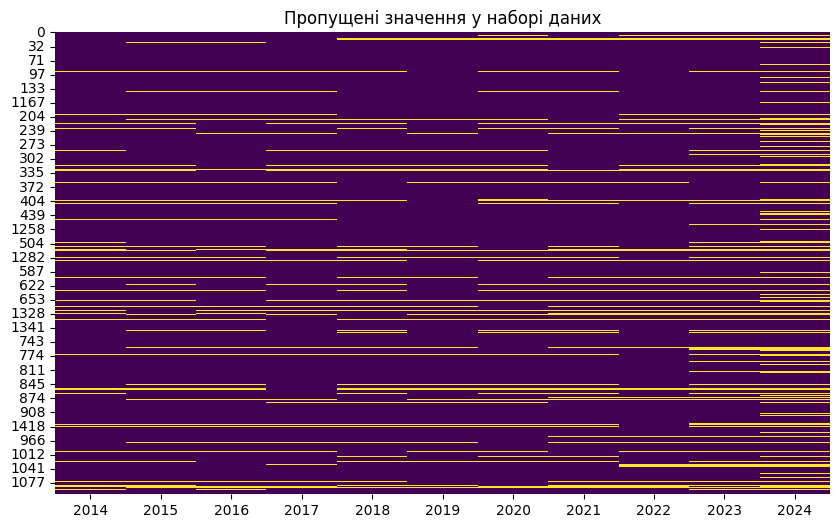

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

numeric = sorted_df.select_dtypes(include=['number']).columns.tolist()
a = sorted_df[numeric]
plt.figure(figsize=(10,6))
sns.heatmap(a.isnull(), cbar=False, cmap='viridis')
plt.title('Пропущені значення у наборі даних')
plt.show()

In [ ]:
sorted_df.isnull().sum()

,0
Country,0
Sex,0
Age,0
age_categories,0
2014,118
2015,147
2016,141
2017,131
2018,147
2019,105


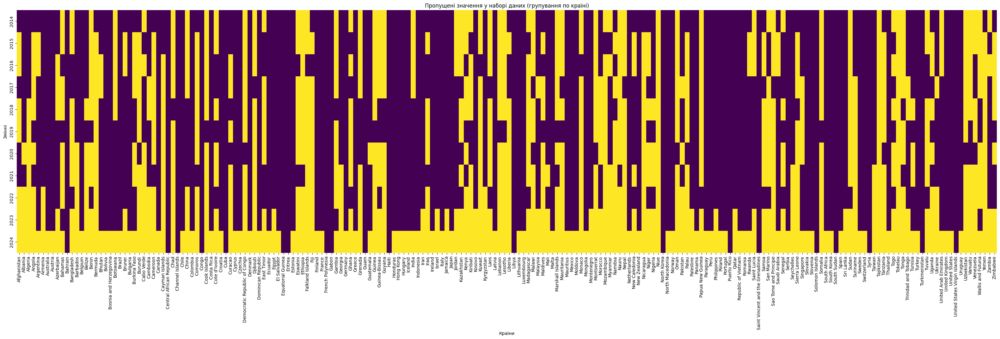

In [ ]:

numeric = sorted_df.select_dtypes(include=['number']).columns.tolist()

grouped_data = sorted_df.groupby('Country')[numeric].apply(lambda x: x.isnull().any())

plt.figure(figsize=(40, 10))

sns.heatmap(grouped_data.T, cbar=False, cmap='viridis', xticklabels=grouped_data.index)

plt.ylabel('Змінні')
plt.xlabel('Країни')

plt.title('Пропущені значення у наборі даних (групування по країні)')
plt.show()


In [ ]:
sorted_df.describe()

,2014,2015,2016,2017,2018,2019,2020,2021,2022,2023,2024
count,1359.000000,1330.000000,1336.000000,1346.000000,1330.000000,1372.000000,1336.000000,1331.000000,1330.000000,1252.000000,1098.000000
mean,11.732770,11.653671,11.436792,11.207778,10.758031,10.524615,12.070118,11.640829,10.356441,10.074294,10.031471
std,11.360987,11.197810,10.925372,10.892681,10.604194,10.321647,11.264072,10.917890,10.182706,9.911157,10.042081
min,0.027000,0.034000,0.038000,0.035000,0.044000,0.036000,0.056000,0.064000,0.067000,0.063000,0.060000
25%,3.973000,4.054750,3.973000,3.829750,3.718000,3.566500,4.370750,4.246000,3.539750,3.535500,3.523000
50%,7.933000,7.848000,7.737500,7.561000,6.933500,6.902000,8.259500,7.823000,6.624500,6.510500,6.466000
75%,15.725500,15.518500,15.264750,14.596000,14.122500,13.804000,15.734750,15.327000,13.441500,12.964500,12.764750
max,74.485000,74.655000,74.720000,75.416000,76.395000,77.173000,83.990000,82.135000,78.776000,78.541000,78.644000


Fill nans in mean by country

In [ ]:
def fill_na_by_country_mean(df, year_cols):
    for year in year_cols:
        df[year] = df.groupby('Country')[year].transform(lambda x: x.fillna(x.mean()))
    return df

year_cols = ['2014', '2015', '2016', '2017', '2018', '2019', '2020', '2021', '2022', '2023', '2024']
df_filled = fill_na_by_country_mean(sorted_df, year_cols)

df_filled

,Country,Sex,Age,age_categories,2014,2015,2016,2017,2018,2019,2020,2021,2022,2023,2024,Continent
0,Afghanistan,Female,15-24,Youth,13.340,15.9740,18.570000,21.137000,20.649000,20.154000,21.2280,21.640,30.5610,32.200000,33.3320,Asia
1111,Afghanistan,Total,25+,Adults,6.773,10.5460,11.876167,8.318000,13.291167,13.401833,9.7920,4.516,20.3845,22.139167,23.4565,Asia
5,Afghanistan,Male,Under 15,Children,7.340,8.3550,9.362000,10.360000,10.137000,9.930000,10.4580,10.970,13.1700,14.411000,15.2960,Asia
4,Afghanistan,Male,25+,Adults,6.463,6.8790,7.301000,7.728000,7.833000,7.961000,8.7320,9.199,11.3570,12.327000,13.0870,Asia
1110,Afghanistan,Total,15-24,Youth,9.963,10.5460,11.876167,17.574000,13.291167,13.401833,16.2000,8.784,20.3845,22.139167,23.4565,Asia
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1104,Zimbabwe,Female,15-24,Youth,8.027,9.0350,9.869000,10.617000,11.353000,12.306000,15.0880,16.168,15.7610,15.627000,15.5550,Africa
1105,Zimbabwe,Female,25+,Adults,4.262,4.5860,4.773000,4.900000,5.027000,5.309000,6.3450,7.792,7.7040,7.597000,7.5280,Africa
1106,Zimbabwe,Female,Under 15,Children,5.174,5.6660,6.014000,6.289000,6.555000,6.990000,8.4940,9.853,9.6700,9.518000,9.4140,Africa
1107,Zimbabwe,Male,15-24,Youth,6.007,7.1310,8.119000,9.029000,9.927000,11.048000,13.1910,14.261,13.9660,13.675000,13.4850,Africa


In [ ]:
ukraine_data = df_filled[df_filled['Country'] == 'Ukraine']

# Екстраполяція
years = ['2022', '2023', '2024']
for year in years:
    ukraine_data[year] = ukraine_data.loc[:, '2014':'2021'].apply(lambda x: np.polyfit(range(2014, 2022), x, 1)[0] * (int(year) - 2021) + x.mean(), axis=1)

df_filled.update(ukraine_data)

<ipython-input-35-9dfc7433b6d2>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ukraine_data[year] = ukraine_data.loc[:, '2014':'2021'].apply(lambda x: np.polyfit(range(2014, 2022), x, 1)[0] * (int(year) - 2021) + x.mean(), axis=1)


In [ ]:
seysheles_data = df_filled[df_filled['Country'] == 'Seychelles']

# Екстраполяція
years = ['2021','2022', '2023', '2024']
for year in years:
    seysheles_data[year] = seysheles_data.loc[:, '2014':'2020'].apply(lambda x: np.polyfit(range(2014, 2021), x, 1)[0] * (int(year) - 2020) + x.mean(), axis=1)

df_filled.update(seysheles_data)

<ipython-input-36-57ae9484a145>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  seysheles_data[year] = seysheles_data.loc[:, '2014':'2020'].apply(lambda x: np.polyfit(range(2014, 2021), x, 1)[0] * (int(year) - 2020) + x.mean(), axis=1)


In [ ]:
palestine_data = df_filled[df_filled['Country'] == 'Palestine']

# Екстраполяція
years = ['2023', '2024']
for year in years:
    palestine_data[year] = palestine_data.loc[:, '2014':'2022'].apply(lambda x: np.polyfit(range(2014, 2023), x, 1)[0] * (int(year) - 2022) + x.mean(), axis=1)

df_filled.update(palestine_data)

<ipython-input-37-ac1e640cddc7>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  palestine_data[year] = palestine_data.loc[:, '2014':'2022'].apply(lambda x: np.polyfit(range(2014, 2023), x, 1)[0] * (int(year) - 2022) + x.mean(), axis=1)


In [ ]:
df_filled

,Country,Sex,Age,age_categories,2014,2015,2016,2017,2018,2019,2020,2021,2022,2023,2024,Continent
0,Afghanistan,Female,15-24,Youth,13.340,15.9740,18.570000,21.137000,20.649000,20.154000,21.2280,21.640,30.5610,32.200000,33.3320,Asia
1111,Afghanistan,Total,25+,Adults,6.773,10.5460,11.876167,8.318000,13.291167,13.401833,9.7920,4.516,20.3845,22.139167,23.4565,Asia
5,Afghanistan,Male,Under 15,Children,7.340,8.3550,9.362000,10.360000,10.137000,9.930000,10.4580,10.970,13.1700,14.411000,15.2960,Asia
4,Afghanistan,Male,25+,Adults,6.463,6.8790,7.301000,7.728000,7.833000,7.961000,8.7320,9.199,11.3570,12.327000,13.0870,Asia
1110,Afghanistan,Total,15-24,Youth,9.963,10.5460,11.876167,17.574000,13.291167,13.401833,16.2000,8.784,20.3845,22.139167,23.4565,Asia
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1104,Zimbabwe,Female,15-24,Youth,8.027,9.0350,9.869000,10.617000,11.353000,12.306000,15.0880,16.168,15.7610,15.627000,15.5550,Africa
1105,Zimbabwe,Female,25+,Adults,4.262,4.5860,4.773000,4.900000,5.027000,5.309000,6.3450,7.792,7.7040,7.597000,7.5280,Africa
1106,Zimbabwe,Female,Under 15,Children,5.174,5.6660,6.014000,6.289000,6.555000,6.990000,8.4940,9.853,9.6700,9.518000,9.4140,Africa
1107,Zimbabwe,Male,15-24,Youth,6.007,7.1310,8.119000,9.029000,9.927000,11.048000,13.1910,14.261,13.9660,13.675000,13.4850,Africa


In [ ]:
df_filled.isnull().sum()

,0
Country,0
Sex,0
Age,0
age_categories,0
2014,26
2015,26
2016,24
2017,30
2018,28
2019,24


In [ ]:
kosovo_data = df_filled[df_filled['Country'] == 'Kosovo']

# Екстраполяція
years = ['2023', '2024']
for year in years:
    kosovo_data[year] = kosovo_data.loc[:, '2014':'2022'].apply(lambda x: np.polyfit(range(2014, 2023), x, 1)[0] * (int(year) - 2022) + x.mean(), axis=1)

df_filled.update(kosovo_data)


<ipython-input-40-c1c65ed88989>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  kosovo_data[year] = kosovo_data.loc[:, '2014':'2022'].apply(lambda x: np.polyfit(range(2014, 2023), x, 1)[0] * (int(year) - 2022) + x.mean(), axis=1)


In [ ]:
df_filled

,Country,Sex,Age,age_categories,2014,2015,2016,2017,2018,2019,2020,2021,2022,2023,2024,Continent
0,Afghanistan,Female,15-24,Youth,13.340,15.9740,18.570000,21.137000,20.649000,20.154000,21.2280,21.640,30.5610,32.200000,33.3320,Asia
1111,Afghanistan,Total,25+,Adults,6.773,10.5460,11.876167,8.318000,13.291167,13.401833,9.7920,4.516,20.3845,22.139167,23.4565,Asia
5,Afghanistan,Male,Under 15,Children,7.340,8.3550,9.362000,10.360000,10.137000,9.930000,10.4580,10.970,13.1700,14.411000,15.2960,Asia
4,Afghanistan,Male,25+,Adults,6.463,6.8790,7.301000,7.728000,7.833000,7.961000,8.7320,9.199,11.3570,12.327000,13.0870,Asia
1110,Afghanistan,Total,15-24,Youth,9.963,10.5460,11.876167,17.574000,13.291167,13.401833,16.2000,8.784,20.3845,22.139167,23.4565,Asia
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1104,Zimbabwe,Female,15-24,Youth,8.027,9.0350,9.869000,10.617000,11.353000,12.306000,15.0880,16.168,15.7610,15.627000,15.5550,Africa
1105,Zimbabwe,Female,25+,Adults,4.262,4.5860,4.773000,4.900000,5.027000,5.309000,6.3450,7.792,7.7040,7.597000,7.5280,Africa
1106,Zimbabwe,Female,Under 15,Children,5.174,5.6660,6.014000,6.289000,6.555000,6.990000,8.4940,9.853,9.6700,9.518000,9.4140,Africa
1107,Zimbabwe,Male,15-24,Youth,6.007,7.1310,8.119000,9.029000,9.927000,11.048000,13.1910,14.261,13.9660,13.675000,13.4850,Africa


In [ ]:
countries_to_delete = [
    'Bermuda', 'Cayman Islands', 'Cook Islands', 'Curacao', 'Falkland Islands',
    'Grenada', 'Monaco', 'Montserrat', 'Niue', 'Tokelau', 'Wallis and Futuna',
    'Tuvalu', 'San Marino', 'Palau','Kiribati','Marshall Islands','Nauru'
]

data_cleaned = df_filled[~df_filled['Country'].isin(countries_to_delete)]

data_cleaned

,Country,Sex,Age,age_categories,2014,2015,2016,2017,2018,2019,2020,2021,2022,2023,2024,Continent
0,Afghanistan,Female,15-24,Youth,13.340,15.9740,18.570000,21.137000,20.649000,20.154000,21.2280,21.640,30.5610,32.200000,33.3320,Asia
1111,Afghanistan,Total,25+,Adults,6.773,10.5460,11.876167,8.318000,13.291167,13.401833,9.7920,4.516,20.3845,22.139167,23.4565,Asia
5,Afghanistan,Male,Under 15,Children,7.340,8.3550,9.362000,10.360000,10.137000,9.930000,10.4580,10.970,13.1700,14.411000,15.2960,Asia
4,Afghanistan,Male,25+,Adults,6.463,6.8790,7.301000,7.728000,7.833000,7.961000,8.7320,9.199,11.3570,12.327000,13.0870,Asia
1110,Afghanistan,Total,15-24,Youth,9.963,10.5460,11.876167,17.574000,13.291167,13.401833,16.2000,8.784,20.3845,22.139167,23.4565,Asia
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1104,Zimbabwe,Female,15-24,Youth,8.027,9.0350,9.869000,10.617000,11.353000,12.306000,15.0880,16.168,15.7610,15.627000,15.5550,Africa
1105,Zimbabwe,Female,25+,Adults,4.262,4.5860,4.773000,4.900000,5.027000,5.309000,6.3450,7.792,7.7040,7.597000,7.5280,Africa
1106,Zimbabwe,Female,Under 15,Children,5.174,5.6660,6.014000,6.289000,6.555000,6.990000,8.4940,9.853,9.6700,9.518000,9.4140,Africa
1107,Zimbabwe,Male,15-24,Youth,6.007,7.1310,8.119000,9.029000,9.927000,11.048000,13.1910,14.261,13.9660,13.675000,13.4850,Africa


In [ ]:
data_cleaned.isnull().sum()

,0
Country,0
Sex,0
Age,0
age_categories,0
2014,0
2015,0
2016,0
2017,0
2018,0
2019,0


In [ ]:
nan_info = []
for index, row in data_cleaned.iterrows():
    for year in ['2014', '2015', '2016', '2017', '2018', '2019', '2020', '2021', '2022', '2023', '2024']:
        if pd.isna(row[year]):
            nan_info.append((row['Country'], year))

for country, year in nan_info:
    print(f"Країна: {country}, Рік: {year} має NaN значення")

## Balancing

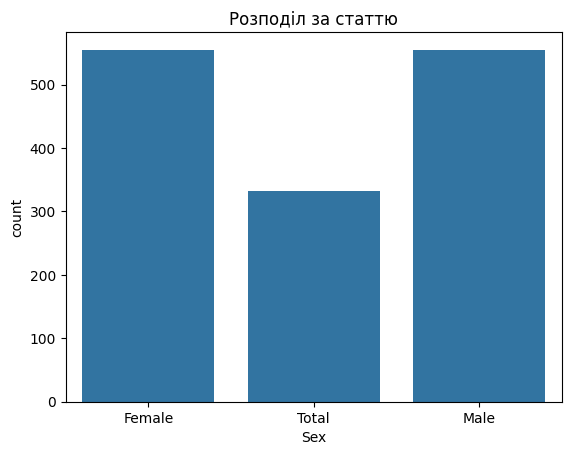

In [ ]:
sns.countplot(x='Sex', data=data_cleaned)
plt.title('Розподіл за статтю')
plt.show()

In [ ]:
years = ['2014', '2015', '2016', '2017', '2018', '2019', '2020', '2021', '2022', '2023', '2024']
data_cleaned[years] = data_cleaned[years].apply(pd.to_numeric, errors='coerce')
df_balanced = data_cleaned.copy()

male_data = data_cleaned[data_cleaned['Sex'] == 'Male']
female_data = data_cleaned[data_cleaned['Sex'] == 'Female']

new_rows = []

for country in data_cleaned['Country'].unique():
    for age in data_cleaned['Age'].unique():
        total_row = df_balanced[(df_balanced['Country'] == country) & (df_balanced['Age'] == age) & (df_balanced['Sex'] == 'Total')]
        if total_row.empty:
            male_row = male_data[(male_data['Country'] == country) & (male_data['Age'] == age)]
            female_row = female_data[(female_data['Country'] == country) & (female_data['Age'] == age)]
            if not male_row.empty and not female_row.empty:
                new_total_row = {
                    'Country': country,
                    'Sex': 'Total',
                    'Age': age,
                    'age_categories': male_row['age_categories'].values[0],
                    'Continent': male_row['Continent'].values[0]
                }

                for year in years:
                    total_value = (male_row[year].values[0] + female_row[year].values[0])/2
                    new_total_row[year] = total_value

                new_rows.append(new_total_row)

new_rows_df = pd.DataFrame(new_rows)
df_balanced = pd.concat([df_balanced, new_rows_df], ignore_index=True)
df_balanced

<ipython-input-46-c8be0cd5d4ef>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_cleaned[years] = data_cleaned[years].apply(pd.to_numeric, errors='coerce')


,Country,Sex,Age,age_categories,2014,2015,2016,2017,2018,2019,2020,2021,2022,2023,2024,Continent
0,Afghanistan,Female,15-24,Youth,13.3400,15.9740,18.570000,21.1370,20.649000,20.154000,21.2280,21.6400,30.5610,32.200000,33.3320,Asia
1,Afghanistan,Total,25+,Adults,6.7730,10.5460,11.876167,8.3180,13.291167,13.401833,9.7920,4.5160,20.3845,22.139167,23.4565,Asia
2,Afghanistan,Male,Under 15,Children,7.3400,8.3550,9.362000,10.3600,10.137000,9.930000,10.4580,10.9700,13.1700,14.411000,15.2960,Asia
3,Afghanistan,Male,25+,Adults,6.4630,6.8790,7.301000,7.7280,7.833000,7.961000,8.7320,9.1990,11.3570,12.327000,13.0870,Asia
4,Afghanistan,Total,15-24,Youth,9.9630,10.5460,11.876167,17.5740,13.291167,13.401833,16.2000,8.7840,20.3845,22.139167,23.4565,Asia
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1664,Vanuatu,Total,Under 15,Children,5.2440,5.3575,5.378000,5.4180,5.467500,5.594000,4.0580,4.8435,5.3670,5.375500,5.3390,Oceania
1665,Venezuela,Total,Under 15,Children,6.9255,6.1580,5.335000,5.1975,5.642500,6.036000,7.6005,7.2285,5.7340,6.034500,5.4905,South America
1666,Yemen,Total,Under 15,Children,19.2470,23.3275,23.835000,24.0300,23.088500,22.759000,23.6310,24.1655,23.2880,23.170500,23.0165,Asia
1667,Zambia,Total,Under 15,Children,8.1535,8.3630,8.459500,8.5535,5.035000,5.509500,6.0715,5.2370,4.4450,4.286500,4.2265,Africa


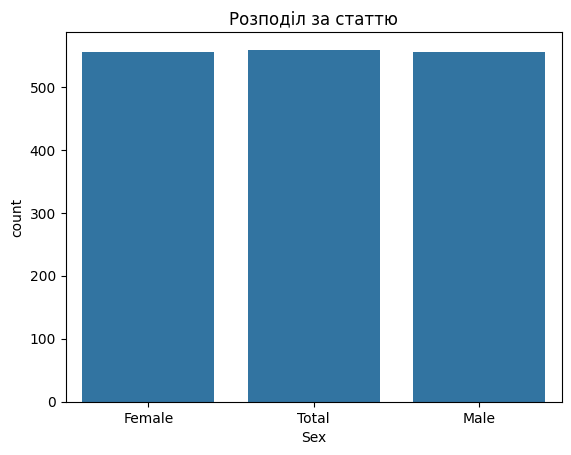

In [ ]:
sns.countplot(x='Sex', data=df_balanced)
plt.title('Розподіл за статтю')
plt.show()

In [ ]:
df_balanced.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1669 entries, 0 to 1668
Data columns (total 16 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   Country         1669 non-null   object 
 1   Sex             1669 non-null   object 
 2   Age             1669 non-null   object 
 3   age_categories  1669 non-null   object 
 4   2014            1669 non-null   float64
 5   2015            1669 non-null   float64
 6   2016            1669 non-null   float64
 7   2017            1669 non-null   float64
 8   2018            1669 non-null   float64
 9   2019            1669 non-null   float64
 10  2020            1669 non-null   float64
 11  2021            1669 non-null   float64
 12  2022            1669 non-null   float64
 13  2023            1669 non-null   float64
 14  2024            1669 non-null   float64
 15  Continent       1669 non-null   object 
dtypes: float64(11), object(5)
memory usage: 208.8+ KB


In [ ]:
from sklearn.preprocessing import MinMaxScaler

scaler = MinMaxScaler()

df_balanced[years] = scaler.fit_transform(df_balanced[years])
df_balanced

,Country,Sex,Age,age_categories,2014,2015,2016,2017,2018,2019,2020,2021,2022,2023,2024,Continent
0,Afghanistan,Female,15-24,Youth,0.178799,0.213613,0.248145,0.279938,0.269872,0.260809,0.252246,0.262894,0.387427,0.409503,0.423394,Asia
1,Afghanistan,Total,25+,Adults,0.090601,0.140872,0.158514,0.109882,0.173504,0.173274,0.115996,0.054246,0.258134,0.281304,0.297726,Asia
2,Afghanistan,Male,Under 15,Children,0.098216,0.111510,0.124849,0.136971,0.132192,0.128265,0.123931,0.132885,0.166474,0.182828,0.193882,Asia
3,Afghanistan,Male,25+,Adults,0.086438,0.091730,0.097252,0.102055,0.102016,0.102739,0.103367,0.111306,0.143440,0.156273,0.165772,Asia
4,Afghanistan,Total,15-24,Youth,0.133444,0.140872,0.158514,0.232671,0.173504,0.173274,0.192342,0.106249,0.258134,0.281304,0.297726,Asia
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1664,Vanuatu,Total,Under 15,Children,0.070066,0.071341,0.071503,0.071411,0.071034,0.072054,0.047680,0.058236,0.067337,0.067694,0.067177,Oceania
1665,Venezuela,Total,Under 15,Children,0.092650,0.082068,0.070927,0.068485,0.073326,0.077784,0.089886,0.087296,0.071999,0.076091,0.069104,South America
1666,Yemen,Total,Under 15,Children,0.258132,0.312157,0.318644,0.318316,0.301823,0.294580,0.280875,0.293666,0.295023,0.294446,0.292127,Asia
1667,Zambia,Total,Under 15,Children,0.109142,0.111617,0.112765,0.113006,0.065369,0.070958,0.071669,0.063031,0.055623,0.053818,0.053020,Africa


##Data Types

In [ ]:
df_balanced.nunique()

,0
Country,187
Sex,3
Age,3
age_categories,3
2014,1577
2015,1578
2016,1564
2017,1573
2018,1557
2019,1577


In [ ]:
df_balanced.dtypes

,0
Country,object
Sex,object
Age,object
age_categories,object
2014,float64
2015,float64
2016,float64
2017,float64
2018,float64
2019,float64


In [ ]:
df_balanced['Sex'].unique()

array(['Female', 'Total', 'Male'], dtype=object)

In [ ]:
df_balanced['Age'].unique()

array(['15-24', '25+', 'Under 15'], dtype=object)

In [ ]:
df_balanced

,Country,Sex,Age,age_categories,2014,2015,2016,2017,2018,2019,2020,2021,2022,2023,2024,Continent
0,Afghanistan,Female,15-24,Youth,0.178799,0.213613,0.248145,0.279938,0.269872,0.260809,0.252246,0.262894,0.387427,0.409503,0.423394,Asia
1,Afghanistan,Total,25+,Adults,0.090601,0.140872,0.158514,0.109882,0.173504,0.173274,0.115996,0.054246,0.258134,0.281304,0.297726,Asia
2,Afghanistan,Male,Under 15,Children,0.098216,0.111510,0.124849,0.136971,0.132192,0.128265,0.123931,0.132885,0.166474,0.182828,0.193882,Asia
3,Afghanistan,Male,25+,Adults,0.086438,0.091730,0.097252,0.102055,0.102016,0.102739,0.103367,0.111306,0.143440,0.156273,0.165772,Asia
4,Afghanistan,Total,15-24,Youth,0.133444,0.140872,0.158514,0.232671,0.173504,0.173274,0.192342,0.106249,0.258134,0.281304,0.297726,Asia
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1664,Vanuatu,Total,Under 15,Children,0.070066,0.071341,0.071503,0.071411,0.071034,0.072054,0.047680,0.058236,0.067337,0.067694,0.067177,Oceania
1665,Venezuela,Total,Under 15,Children,0.092650,0.082068,0.070927,0.068485,0.073326,0.077784,0.089886,0.087296,0.071999,0.076091,0.069104,South America
1666,Yemen,Total,Under 15,Children,0.258132,0.312157,0.318644,0.318316,0.301823,0.294580,0.280875,0.293666,0.295023,0.294446,0.292127,Asia
1667,Zambia,Total,Under 15,Children,0.109142,0.111617,0.112765,0.113006,0.065369,0.070958,0.071669,0.063031,0.055623,0.053818,0.053020,Africa


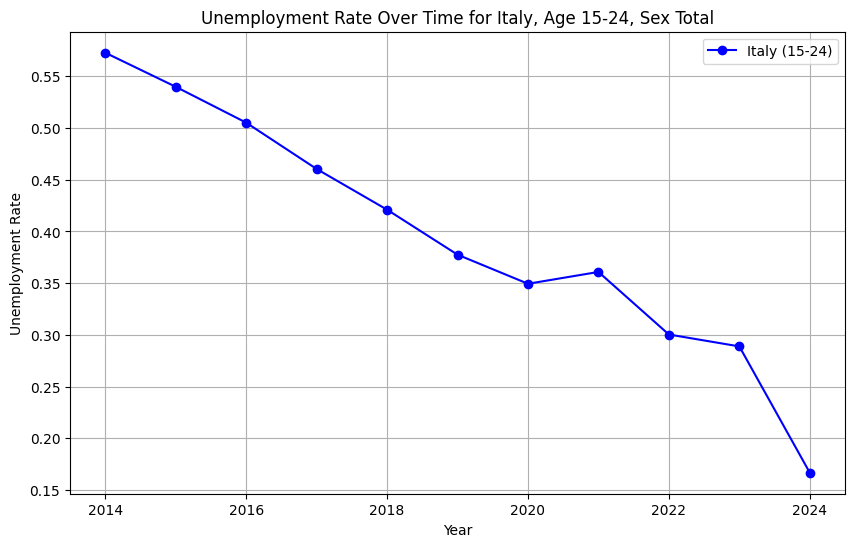

In [ ]:
import matplotlib.pyplot as plt

country = "Italy"
age_category = "15-24"
sex = "Total"
continent = "Europe"

filtered_data = df_balanced[(df_balanced['Country'] == country) &
                            (df_balanced['Age'] == age_category) &
                            (df_balanced['Sex'] == sex) &
                            (df_balanced['Continent'] == continent)]

if not filtered_data.empty:
    years = filtered_data.columns[4:-1].astype(int)
    values = filtered_data.iloc[0, 4:-1].astype(float)

    plt.figure(figsize=(10, 6))
    plt.plot(years, values, marker='o', linestyle='-', color='b', label=f'{country} ({age_category})')
    plt.title(f'Unemployment Rate Over Time for {country}, Age {age_category}, Sex {sex}')
    plt.xlabel('Year')
    plt.ylabel('Unemployment Rate')
    plt.grid(True)
    plt.legend()
    plt.show()
else:
    print("No data available for the specified filter.")


In [ ]:
df_balanced.to_csv('balanced_data.csv', index=False)

## Modifying the structure of our dataset

In [ ]:
df_long = df_balanced.melt(
    id_vars=['Country', 'Sex', 'Age', 'age_categories', 'Continent'],
    var_name='Year',
    value_name='UnemploymentRate'
)

df_long['Year'] = df_long['Year'].astype(int)
df_long

,Country,Sex,Age,age_categories,Continent,Year,UnemploymentRate
0,Afghanistan,Female,15-24,Youth,Asia,2014,0.178799
1,Afghanistan,Total,25+,Adults,Asia,2014,0.090601
2,Afghanistan,Male,Under 15,Children,Asia,2014,0.098216
3,Afghanistan,Male,25+,Adults,Asia,2014,0.086438
4,Afghanistan,Total,15-24,Youth,Asia,2014,0.133444
...,...,...,...,...,...,...,...
18354,Vanuatu,Total,Under 15,Children,Oceania,2024,0.067177
18355,Venezuela,Total,Under 15,Children,South America,2024,0.069104
18356,Yemen,Total,Under 15,Children,Asia,2024,0.292127
18357,Zambia,Total,Under 15,Children,Africa,2024,0.053020


In [ ]:
age_categories = df_long['Age'].unique()
age_categories

array(['15-24', '25+', 'Under 15'], dtype=object)

In [ ]:
df_long = df_long[df_long['Age'] != 'Under 15']
df_long

,Country,Sex,Age,age_categories,Continent,Year,UnemploymentRate
0,Afghanistan,Female,15-24,Youth,Asia,2014,0.178799
1,Afghanistan,Total,25+,Adults,Asia,2014,0.090601
3,Afghanistan,Male,25+,Adults,Asia,2014,0.086438
4,Afghanistan,Total,15-24,Youth,Asia,2014,0.133444
6,Afghanistan,Female,25+,Adults,Asia,2014,0.114816
...,...,...,...,...,...,...,...
18330,Syria,Total,25+,Adults,Asia,2024,0.153543
18341,Turkmenistan,Total,15-24,Youth,Asia,2024,0.124287
18342,Turkmenistan,Total,25+,Adults,Asia,2024,0.043119
18349,United States Virgin Islands,Total,15-24,Youth,North America,2024,0.360035


In [ ]:
df_long.to_csv('df_long.csv', index=False)

## Labour Force

In [ ]:
monthly_labour_force= pd.read_csv("/content/drive/MyDrive/labour_force.csv")
monthly_labour_force

<ipython-input-61-a726a2135185>:1: DtypeWarning: Columns (8) have mixed types. Specify dtype option on import or set low_memory=False.
  monthly_labour_force= pd.read_csv("/content/drive/MyDrive/labour_force.csv")


,ref_area.label,source.label,indicator.label,sex.label,classif1.label,time,obs_value,obs_status.label,note_classif.label,note_indicator.label,note_source.label
0,Australia,LFS - Labour Force Survey,Labour force by sex and age (thousands),Sex: Total,"Age (Youth, adults): 15+",2024M05,15051.784,NaN,NaN,Frequency: Monthly,NaN
1,Australia,LFS - Labour Force Survey,Labour force by sex and age (thousands),Sex: Total,"Age (Youth, adults): 15-24",2024M05,2451.280,NaN,NaN,Frequency: Monthly,NaN
2,Australia,LFS - Labour Force Survey,Labour force by sex and age (thousands),Sex: Total,"Age (Youth, adults): 25+",2024M05,12600.505,NaN,NaN,Frequency: Monthly,NaN
3,Australia,LFS - Labour Force Survey,Labour force by sex and age (thousands),Sex: Male,"Age (Youth, adults): 15+",2024M05,7862.645,NaN,NaN,Frequency: Monthly,NaN
4,Australia,LFS - Labour Force Survey,Labour force by sex and age (thousands),Sex: Male,"Age (Youth, adults): 15-24",2024M05,1270.801,NaN,NaN,Frequency: Monthly,NaN
...,...,...,...,...,...,...,...,...,...,...,...
93983,United States of America,LFS - Current Population Survey,Labour force by sex and age (thousands),Sex: Female,Age (10-year bands): 25-34,2014M01,15662.415,NaN,NaN,Frequency: Monthly,Repository: ILO-STATISTICS - Micro data proces...
93984,United States of America,LFS - Current Population Survey,Labour force by sex and age (thousands),Sex: Female,Age (10-year bands): 35-44,2014M01,15075.877,NaN,NaN,Frequency: Monthly,Repository: ILO-STATISTICS - Micro data proces...
93985,United States of America,LFS - Current Population Survey,Labour force by sex and age (thousands),Sex: Female,Age (10-year bands): 45-54,2014M01,16121.981,NaN,NaN,Frequency: Monthly,Repository: ILO-STATISTICS - Micro data proces...
93986,United States of America,LFS - Current Population Survey,Labour force by sex and age (thousands),Sex: Female,Age (10-year bands): 55-64,2014M01,11972.922,NaN,NaN,Frequency: Monthly,Repository: ILO-STATISTICS - Micro data proces...


In [ ]:
unique_countries_count = monthly_labour_force['ref_area.label'].nunique()
unique_countries_count

36

In [ ]:
monthly_labour_force_filtered = monthly_labour_force[['ref_area.label','sex.label',
                                      'classif1.label','obs_value', 'time']]
monthly_labour_force_filtered

,ref_area.label,sex.label,classif1.label,obs_value,time
0,Australia,Sex: Total,"Age (Youth, adults): 15+",15051.784,2024M05
1,Australia,Sex: Total,"Age (Youth, adults): 15-24",2451.280,2024M05
2,Australia,Sex: Total,"Age (Youth, adults): 25+",12600.505,2024M05
3,Australia,Sex: Male,"Age (Youth, adults): 15+",7862.645,2024M05
4,Australia,Sex: Male,"Age (Youth, adults): 15-24",1270.801,2024M05
...,...,...,...,...,...
93983,United States of America,Sex: Female,Age (10-year bands): 25-34,15662.415,2014M01
93984,United States of America,Sex: Female,Age (10-year bands): 35-44,15075.877,2014M01
93985,United States of America,Sex: Female,Age (10-year bands): 45-54,16121.981,2014M01
93986,United States of America,Sex: Female,Age (10-year bands): 55-64,11972.922,2014M01


In [ ]:
unique_classif1_labels = monthly_labour_force_filtered['classif1.label'].unique()
print(unique_classif1_labels)


['Age (Youth, adults): 15+' 'Age (Youth, adults): 15-24'
 'Age (Youth, adults): 25+' 'Age (Youth, adults): 15-64'
 'Age (Aggregate bands): Total' 'Age (Aggregate bands): 15-24'
 'Age (Aggregate bands): 25-54' 'Age (Aggregate bands): 55-64'
 'Age (Aggregate bands): 65+' 'Age (10-year bands): Total'
 'Age (10-year bands): 15-24' 'Age (10-year bands): 25-34'
 'Age (10-year bands): 35-44' 'Age (10-year bands): 45-54'
 'Age (10-year bands): 55-64' 'Age (10-year bands): 65+']


In [ ]:
filtered_labour_force = monthly_labour_force_filtered[
    monthly_labour_force_filtered['classif1.label'].isin(['Age (Youth, adults): 25+', 'Age (Youth, adults): 15-24'])
]
filtered_labour_force

,ref_area.label,sex.label,classif1.label,obs_value,time
1,Australia,Sex: Total,"Age (Youth, adults): 15-24",2451.280,2024M05
2,Australia,Sex: Total,"Age (Youth, adults): 25+",12600.505,2024M05
4,Australia,Sex: Male,"Age (Youth, adults): 15-24",1270.801,2024M05
5,Australia,Sex: Male,"Age (Youth, adults): 25+",6591.844,2024M05
7,Australia,Sex: Female,"Age (Youth, adults): 15-24",1180.479,2024M05
...,...,...,...,...,...
93943,United States of America,Sex: Total,"Age (Youth, adults): 25+",133957.920,2014M01
93946,United States of America,Sex: Male,"Age (Youth, adults): 15-24",10399.890,2014M01
93947,United States of America,Sex: Male,"Age (Youth, adults): 25+",71404.476,2014M01
93950,United States of America,Sex: Female,"Age (Youth, adults): 15-24",10022.812,2014M01


In [ ]:
filtered_labour_force['sex.label'] = filtered_labour_force['sex.label'].str.replace('Sex: ', '', regex=False)
filtered_labour_force['classif1.label'] = filtered_labour_force['classif1.label'].str.replace(r'Age \(.*?\): ', '', regex=True)

filtered_labour_force

<ipython-input-66-4040ad639ba2>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_labour_force['sex.label'] = filtered_labour_force['sex.label'].str.replace('Sex: ', '', regex=False)
<ipython-input-66-4040ad639ba2>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_labour_force['classif1.label'] = filtered_labour_force['classif1.label'].str.replace(r'Age \(.*?\): ', '', regex=True)


,ref_area.label,sex.label,classif1.label,obs_value,time
1,Australia,Total,15-24,2451.280,2024M05
2,Australia,Total,25+,12600.505,2024M05
4,Australia,Male,15-24,1270.801,2024M05
5,Australia,Male,25+,6591.844,2024M05
7,Australia,Female,15-24,1180.479,2024M05
...,...,...,...,...,...
93943,United States of America,Total,25+,133957.920,2014M01
93946,United States of America,Male,15-24,10399.890,2014M01
93947,United States of America,Male,25+,71404.476,2014M01
93950,United States of America,Female,15-24,10022.812,2014M01


In [ ]:
filtered_labour_force.rename(columns={'ref_area.label': 'Country',
                              'sex.label':'Sex'	,'classif1.label':'Age',
                              'obs_value':'Value'}, inplace=True)

filtered_labour_force['Year'] = filtered_labour_force['time'].str[:4]
filtered_labour_force['Month'] = filtered_labour_force['time'].str[5:]

filtered_labour_force.drop(columns=['time'], inplace=True)
filtered_labour_force

<ipython-input-67-157f45009a41>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_labour_force.rename(columns={'ref_area.label': 'Country',
<ipython-input-67-157f45009a41>:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_labour_force['Year'] = filtered_labour_force['time'].str[:4]
<ipython-input-67-157f45009a41>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/use

,Country,Sex,Age,Value,Year,Month
1,Australia,Total,15-24,2451.280,2024,05
2,Australia,Total,25+,12600.505,2024,05
4,Australia,Male,15-24,1270.801,2024,05
5,Australia,Male,25+,6591.844,2024,05
7,Australia,Female,15-24,1180.479,2024,05
...,...,...,...,...,...,...
93943,United States of America,Total,25+,133957.920,2014,01
93946,United States of America,Male,15-24,10399.890,2014,01
93947,United States of America,Male,25+,71404.476,2014,01
93950,United States of America,Female,15-24,10022.812,2014,01


In [ ]:
age_categories = filtered_labour_force['Age'].unique()
age_categories

array(['15-24', '25+'], dtype=object)

In [ ]:
unique_countries_count = filtered_labour_force['Country'].nunique()
unique_countries_count

27

In [ ]:
age_categories = filtered_labour_force['Age'].unique()
age_categories

array(['15-24', '25+'], dtype=object)

## Unemployment rate by month

In [ ]:
ur_monthly = pd.read_csv("/content/drive/MyDrive/ur_montly_th.csv")
ur_monthly

,ref_area.label,source.label,indicator.label,sex.label,classif1.label,time,obs_value,obs_status.label,note_classif.label,note_indicator.label,note_source.label
0,Armenia,ADM-EOR - Employment Office Records,Unemployment by sex and age (thousands),Sex: Total,"Age (Youth, adults): 15+",2016M04,81.000,NaN,NaN,Unemployment definition: Registered unemployed...,Age coverage - minimum age: 16 years old
1,Armenia,ADM-EOR - Employment Office Records,Unemployment by sex and age (thousands),Sex: Total,"Age (Youth, adults): 15+",2016M03,80.300,NaN,NaN,Unemployment definition: Registered unemployed...,Age coverage - minimum age: 16 years old
2,Armenia,ADM-EOR - Employment Office Records,Unemployment by sex and age (thousands),Sex: Total,"Age (Youth, adults): 15+",2016M02,78.500,NaN,NaN,Unemployment definition: Registered unemployed...,Age coverage - minimum age: 16 years old
3,Armenia,ADM-EOR - Employment Office Records,Unemployment by sex and age (thousands),Sex: Total,"Age (Youth, adults): 15+",2016M01,77.300,NaN,NaN,Unemployment definition: Registered unemployed...,Age coverage - minimum age: 16 years old
4,Armenia,ADM-EOR - Employment Office Records,Unemployment by sex and age (thousands),Sex: Total,"Age (Youth, adults): 15+",2014M09,65.400,NaN,NaN,Unemployment definition: Registered unemployed...,Age coverage - minimum age: 16 years old
...,...,...,...,...,...,...,...,...,...,...,...
129845,United States of America,LFS - Current Population Survey,Unemployment by sex and age (thousands),Sex: Female,Age (10-year bands): 25-34,2014M01,1037.520,NaN,NaN,Frequency: Monthly,Repository: ILO-STATISTICS - Micro data proces...
129846,United States of America,LFS - Current Population Survey,Unemployment by sex and age (thousands),Sex: Female,Age (10-year bands): 35-44,2014M01,796.833,NaN,NaN,Frequency: Monthly,Repository: ILO-STATISTICS - Micro data proces...
129847,United States of America,LFS - Current Population Survey,Unemployment by sex and age (thousands),Sex: Female,Age (10-year bands): 45-54,2014M01,813.075,NaN,NaN,Frequency: Monthly,Repository: ILO-STATISTICS - Micro data proces...
129848,United States of America,LFS - Current Population Survey,Unemployment by sex and age (thousands),Sex: Female,Age (10-year bands): 55-64,2014M01,540.781,NaN,NaN,Frequency: Monthly,Repository: ILO-STATISTICS - Micro data proces...


In [ ]:
unique_countries_count = ur_monthly['ref_area.label'].nunique()
unique_countries_count

78

In [ ]:
monthly_ur_filtered = ur_monthly[['ref_area.label','sex.label',
                                      'classif1.label','obs_value', 'time']]
monthly_ur_filtered

,ref_area.label,sex.label,classif1.label,obs_value,time
0,Armenia,Sex: Total,"Age (Youth, adults): 15+",81.000,2016M04
1,Armenia,Sex: Total,"Age (Youth, adults): 15+",80.300,2016M03
2,Armenia,Sex: Total,"Age (Youth, adults): 15+",78.500,2016M02
3,Armenia,Sex: Total,"Age (Youth, adults): 15+",77.300,2016M01
4,Armenia,Sex: Total,"Age (Youth, adults): 15+",65.400,2014M09
...,...,...,...,...,...
129845,United States of America,Sex: Female,Age (10-year bands): 25-34,1037.520,2014M01
129846,United States of America,Sex: Female,Age (10-year bands): 35-44,796.833,2014M01
129847,United States of America,Sex: Female,Age (10-year bands): 45-54,813.075,2014M01
129848,United States of America,Sex: Female,Age (10-year bands): 55-64,540.781,2014M01


In [ ]:
filtered_ur = monthly_ur_filtered[
    monthly_ur_filtered['classif1.label'].isin(['Age (Youth, adults): 25+', 'Age (Youth, adults): 15-24'])
]
filtered_ur

,ref_area.label,sex.label,classif1.label,obs_value,time
5,Armenia,Sex: Total,"Age (Youth, adults): 15-24",7.000,2014M09
6,Armenia,Sex: Total,"Age (Youth, adults): 25+",58.400,2014M09
8,Armenia,Sex: Total,"Age (Youth, adults): 15-24",6.700,2014M08
9,Armenia,Sex: Total,"Age (Youth, adults): 25+",58.300,2014M08
11,Armenia,Sex: Total,"Age (Youth, adults): 15-24",6.400,2014M07
...,...,...,...,...,...
129805,United States of America,Sex: Total,"Age (Youth, adults): 25+",7803.702,2014M01
129808,United States of America,Sex: Male,"Age (Youth, adults): 15-24",1715.177,2014M01
129809,United States of America,Sex: Male,"Age (Youth, adults): 25+",4437.452,2014M01
129812,United States of America,Sex: Female,"Age (Youth, adults): 15-24",1335.732,2014M01


In [ ]:
filtered_ur['sex.label'] = filtered_ur['sex.label'].str.replace('Sex: ', '', regex=False)
filtered_ur['classif1.label'] = filtered_ur['classif1.label'].str.replace(r'Age \(.*?\): ', '', regex=True)

filtered_ur

<ipython-input-75-6ec1f05c2fe1>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_ur['sex.label'] = filtered_ur['sex.label'].str.replace('Sex: ', '', regex=False)
<ipython-input-75-6ec1f05c2fe1>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_ur['classif1.label'] = filtered_ur['classif1.label'].str.replace(r'Age \(.*?\): ', '', regex=True)


,ref_area.label,sex.label,classif1.label,obs_value,time
5,Armenia,Total,15-24,7.000,2014M09
6,Armenia,Total,25+,58.400,2014M09
8,Armenia,Total,15-24,6.700,2014M08
9,Armenia,Total,25+,58.300,2014M08
11,Armenia,Total,15-24,6.400,2014M07
...,...,...,...,...,...
129805,United States of America,Total,25+,7803.702,2014M01
129808,United States of America,Male,15-24,1715.177,2014M01
129809,United States of America,Male,25+,4437.452,2014M01
129812,United States of America,Female,15-24,1335.732,2014M01


In [ ]:
filtered_ur.rename(columns={'ref_area.label': 'Country',
                              'sex.label':'Sex'	,'classif1.label':'Age',
                              'obs_value':'Value'}, inplace=True)

filtered_ur['Year'] = filtered_ur['time'].str[:4]
filtered_ur['Month'] = filtered_ur['time'].str[5:]

filtered_ur.drop(columns=['time'], inplace=True)
filtered_ur

<ipython-input-76-c37e7d3975b9>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_ur.rename(columns={'ref_area.label': 'Country',
<ipython-input-76-c37e7d3975b9>:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_ur['Year'] = filtered_ur['time'].str[:4]
<ipython-input-76-c37e7d3975b9>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returnin

,Country,Sex,Age,Value,Year,Month
5,Armenia,Total,15-24,7.000,2014,09
6,Armenia,Total,25+,58.400,2014,09
8,Armenia,Total,15-24,6.700,2014,08
9,Armenia,Total,25+,58.300,2014,08
11,Armenia,Total,15-24,6.400,2014,07
...,...,...,...,...,...,...
129805,United States of America,Total,25+,7803.702,2014,01
129808,United States of America,Male,15-24,1715.177,2014,01
129809,United States of America,Male,25+,4437.452,2014,01
129812,United States of America,Female,15-24,1335.732,2014,01


In [ ]:
age_categories = filtered_ur['Age'].unique()
age_categories

array(['15-24', '25+'], dtype=object)

In [ ]:
# categories_to_remove = ['15+', '15-64', 'Total', '25-54', '55-64', '65+',
#        '25-34', '35-44', '45-54', '15-19', '20-24', '25-29', '30-34',
#        '35-39', '40-44', '45-49', '50-54', '55-59', '60-64']
# monthly_ur_filtered = monthly_ur_filtered[~monthly_ur_filtered['Age'].isin(categories_to_remove)]
# monthly_ur_filtered

In [ ]:
filtered_labour_force

,Country,Sex,Age,Value,Year,Month
1,Australia,Total,15-24,2451.280,2024,05
2,Australia,Total,25+,12600.505,2024,05
4,Australia,Male,15-24,1270.801,2024,05
5,Australia,Male,25+,6591.844,2024,05
7,Australia,Female,15-24,1180.479,2024,05
...,...,...,...,...,...,...
93943,United States of America,Total,25+,133957.920,2014,01
93946,United States of America,Male,15-24,10399.890,2014,01
93947,United States of America,Male,25+,71404.476,2014,01
93950,United States of America,Female,15-24,10022.812,2014,01


In [ ]:
filtered_ur

,Country,Sex,Age,Value,Year,Month
5,Armenia,Total,15-24,7.000,2014,09
6,Armenia,Total,25+,58.400,2014,09
8,Armenia,Total,15-24,6.700,2014,08
9,Armenia,Total,25+,58.300,2014,08
11,Armenia,Total,15-24,6.400,2014,07
...,...,...,...,...,...,...
129805,United States of America,Total,25+,7803.702,2014,01
129808,United States of America,Male,15-24,1715.177,2014,01
129809,United States of America,Male,25+,4437.452,2014,01
129812,United States of America,Female,15-24,1335.732,2014,01


In [ ]:
merged_df = pd.merge(filtered_labour_force, filtered_ur,
                     on=['Country', 'Sex', 'Age', 'Year', 'Month'],
                     suffixes=('_Labour', '_Unemployed'))

merged_df['Unemployment Rate (%)'] = (merged_df['Value_Unemployed'] / merged_df['Value_Labour'])

result_df = merged_df[['Country', 'Sex', 'Age', 'Year', 'Month', 'Unemployment Rate (%)']]
result_df

,Country,Sex,Age,Year,Month,Unemployment Rate (%)
0,Australia,Total,15-24,2024,05,0.094726
1,Australia,Total,25+,2024,05,0.028697
2,Australia,Male,15-24,2024,05,0.105714
3,Australia,Male,25+,2024,05,0.028217
4,Australia,Female,15-24,2024,05,0.082897
...,...,...,...,...,...,...
12171,United States of America,Total,25+,2014,01,0.058255
12172,United States of America,Male,15-24,2014,01,0.164923
12173,United States of America,Male,25+,2014,01,0.062145
12174,United States of America,Female,15-24,2014,01,0.133269


In [ ]:
result_df = result_df[result_df['Country'] != "Taiwan, China"]

result_df['Country'] = result_df['Country'].replace("Hong Kong, China", "China")

result_df

<ipython-input-82-6ed9a0a1d917>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  result_df['Country'] = result_df['Country'].replace("Hong Kong, China", "China")


,Country,Sex,Age,Year,Month,Unemployment Rate (%)
0,Australia,Total,15-24,2024,05,0.094726
1,Australia,Total,25+,2024,05,0.028697
2,Australia,Male,15-24,2024,05,0.105714
3,Australia,Male,25+,2024,05,0.028217
4,Australia,Female,15-24,2024,05,0.082897
...,...,...,...,...,...,...
12171,United States of America,Total,25+,2014,01,0.058255
12172,United States of America,Male,15-24,2014,01,0.164923
12173,United States of America,Male,25+,2014,01,0.062145
12174,United States of America,Female,15-24,2014,01,0.133269


In [ ]:
unique_countries_count = filtered_labour_force['Country'].nunique()
unique_countries_count

27

In [ ]:
filtered_labour_force

,Country,Sex,Age,Value,Year,Month
1,Australia,Total,15-24,2451.280,2024,05
2,Australia,Total,25+,12600.505,2024,05
4,Australia,Male,15-24,1270.801,2024,05
5,Australia,Male,25+,6591.844,2024,05
7,Australia,Female,15-24,1180.479,2024,05
...,...,...,...,...,...,...
93943,United States of America,Total,25+,133957.920,2014,01
93946,United States of America,Male,15-24,10399.890,2014,01
93947,United States of America,Male,25+,71404.476,2014,01
93950,United States of America,Female,15-24,10022.812,2014,01


In [ ]:
import plotly
import plotly.express as px

fig = px.choropleth(result_df,
                    locations='Country',
                    locationmode='country names',
                    color='Unemployment Rate (%)',
                    hover_name='Country',
                    color_continuous_scale='Viridis',
                    title='Global Population Distribution in 2022')


fig.update_layout(geo=dict(showframe=False, showcoastlines=False))

fig.show()

## OECD

In [ ]:
test = pd.read_csv('/content/drive/MyDrive/oecd.csv')
test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 29940 entries, 0 to 29939
Data columns (total 34 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   STRUCTURE                 29940 non-null  object 
 1   STRUCTURE_ID              29940 non-null  object 
 2   STRUCTURE_NAME            29940 non-null  object 
 3   ACTION                    29940 non-null  object 
 4   REF_AREA                  29940 non-null  object 
 5   Reference area            29940 non-null  object 
 6   MEASURE                   29940 non-null  object 
 7   Measure                   29940 non-null  object 
 8   UNIT_MEASURE              29940 non-null  object 
 9   Unit of measure           29940 non-null  object 
 10  TRANSFORMATION            29940 non-null  object 
 11  Transformation            29940 non-null  object 
 12  ADJUSTMENT                29940 non-null  object 
 13  Adjustment                29940 non-null  object 
 14  SEX   

In [ ]:
filtered_df = test[['Age','Sex', 'Reference area','OBS_VALUE','TIME_PERIOD']]
filtered_df

,Age,Sex,Reference area,OBS_VALUE,TIME_PERIOD
0,25 years or over,Female,Ireland,9.6,2014-04
1,25 years or over,Total,Norway,2.8,2014-10
2,25 years or over,Male,Iceland,5.2,2021-01
3,25 years or over,Male,Iceland,4.9,2021-02
4,25 years or over,Male,Iceland,4.8,2021-03
...,...,...,...,...,...
29935,25 years or over,Female,Finland,5.6,2024-07
29936,From 15 to 24 years,Male,Lithuania,12.3,2022-10
29937,From 15 to 24 years,Male,Latvia,18.0,2023-10
29938,From 15 to 24 years,Male,Ireland,10.9,2022-07


In [ ]:
df_filtered = filtered_df[filtered_df['Age'].isin(['25 years or over', 'From 15 to 24 years'])]


df_filtered['Age'] = df_filtered['Age'].replace({
    '25 years or over': '25+',
    'From 15 to 24 years': '15-24'
})


<ipython-input-88-b8f8c59b7cee>:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [ ]:
df_filtered

,Age,Sex,Reference area,OBS_VALUE,TIME_PERIOD
0,25+,Female,Ireland,9.6,2014-04
1,25+,Total,Norway,2.8,2014-10
2,25+,Male,Iceland,5.2,2021-01
3,25+,Male,Iceland,4.9,2021-02
4,25+,Male,Iceland,4.8,2021-03
...,...,...,...,...,...
29935,25+,Female,Finland,5.6,2024-07
29936,15-24,Male,Lithuania,12.3,2022-10
29937,15-24,Male,Latvia,18.0,2023-10
29938,15-24,Male,Ireland,10.9,2022-07


In [ ]:
df_filtered.rename(columns={'Reference area': 'Country',
                              'OBS_VALUE':'Unemployment Rate (%)'}, inplace=True)
df_filtered

<ipython-input-90-ac9954c6cee1>:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,Age,Sex,Country,Unemployment Rate (%),TIME_PERIOD
0,25+,Female,Ireland,9.6,2014-04
1,25+,Total,Norway,2.8,2014-10
2,25+,Male,Iceland,5.2,2021-01
3,25+,Male,Iceland,4.9,2021-02
4,25+,Male,Iceland,4.8,2021-03
...,...,...,...,...,...
29935,25+,Female,Finland,5.6,2024-07
29936,15-24,Male,Lithuania,12.3,2022-10
29937,15-24,Male,Latvia,18.0,2023-10
29938,15-24,Male,Ireland,10.9,2022-07


In [ ]:
df_filtered[['Year', 'Month']] = df_filtered['TIME_PERIOD'].str.split('-', expand=True)

df_filtered = df_filtered.drop(columns=['TIME_PERIOD'])
df_filtered

<ipython-input-91-67386870e7f4>:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-91-67386870e7f4>:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,Age,Sex,Country,Unemployment Rate (%),Year,Month
0,25+,Female,Ireland,9.6,2014,04
1,25+,Total,Norway,2.8,2014,10
2,25+,Male,Iceland,5.2,2021,01
3,25+,Male,Iceland,4.9,2021,02
4,25+,Male,Iceland,4.8,2021,03
...,...,...,...,...,...,...
29935,25+,Female,Finland,5.6,2024,07
29936,15-24,Male,Lithuania,12.3,2022,10
29937,15-24,Male,Latvia,18.0,2023,10
29938,15-24,Male,Ireland,10.9,2022,07


In [ ]:
df_filtered['Unemployment Rate (%)'] = df_filtered['Unemployment Rate (%)'] / 100

In [ ]:
result_df

,Country,Sex,Age,Year,Month,Unemployment Rate (%)
0,Australia,Total,15-24,2024,05,0.094726
1,Australia,Total,25+,2024,05,0.028697
2,Australia,Male,15-24,2024,05,0.105714
3,Australia,Male,25+,2024,05,0.028217
4,Australia,Female,15-24,2024,05,0.082897
...,...,...,...,...,...,...
12171,United States of America,Total,25+,2014,01,0.058255
12172,United States of America,Male,15-24,2014,01,0.164923
12173,United States of America,Male,25+,2014,01,0.062145
12174,United States of America,Female,15-24,2014,01,0.133269


In [ ]:
combined_df = pd.concat([df_filtered, result_df], ignore_index=True)

In [ ]:
combined_df

,Age,Sex,Country,Unemployment Rate (%),Year,Month
0,25+,Female,Ireland,0.096000,2014,04
1,25+,Total,Norway,0.028000,2014,10
2,25+,Male,Iceland,0.052000,2021,01
3,25+,Male,Iceland,0.049000,2021,02
4,25+,Male,Iceland,0.048000,2021,03
...,...,...,...,...,...,...
31542,25+,Total,United States of America,0.058255,2014,01
31543,15-24,Male,United States of America,0.164923,2014,01
31544,25+,Male,United States of America,0.062145,2014,01
31545,15-24,Female,United States of America,0.133269,2014,01


In [ ]:
combined_df = combined_df[combined_df['Country'] != "Russian Federation"]

In [ ]:
unique_countries_count = combined_df['Country'].nunique()
unique_countries_count

51

In [ ]:
import plotly
import plotly.express as px

fig = px.choropleth(combined_df,
                    locations='Country',
                    locationmode='country names',
                    color='Unemployment Rate (%)',
                    hover_name='Country',
                    color_continuous_scale='Viridis',
                    title='Global Population Distribution in 2022')


fig.update_layout(geo=dict(showframe=False, showcoastlines=False))

fig.show()

#Visualization

In [ ]:
df_balanced

,Country,Sex,Age,age_categories,2014,2015,2016,2017,2018,2019,2020,2021,2022,2023,2024,Continent
0,Afghanistan,Female,15-24,Youth,0.178799,0.213613,0.248145,0.279938,0.269872,0.260809,0.252246,0.262894,0.387427,0.409503,0.423394,Asia
1,Afghanistan,Total,25+,Adults,0.090601,0.140872,0.158514,0.109882,0.173504,0.173274,0.115996,0.054246,0.258134,0.281304,0.297726,Asia
2,Afghanistan,Male,Under 15,Children,0.098216,0.111510,0.124849,0.136971,0.132192,0.128265,0.123931,0.132885,0.166474,0.182828,0.193882,Asia
3,Afghanistan,Male,25+,Adults,0.086438,0.091730,0.097252,0.102055,0.102016,0.102739,0.103367,0.111306,0.143440,0.156273,0.165772,Asia
4,Afghanistan,Total,15-24,Youth,0.133444,0.140872,0.158514,0.232671,0.173504,0.173274,0.192342,0.106249,0.258134,0.281304,0.297726,Asia
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1664,Vanuatu,Total,Under 15,Children,0.070066,0.071341,0.071503,0.071411,0.071034,0.072054,0.047680,0.058236,0.067337,0.067694,0.067177,Oceania
1665,Venezuela,Total,Under 15,Children,0.092650,0.082068,0.070927,0.068485,0.073326,0.077784,0.089886,0.087296,0.071999,0.076091,0.069104,South America
1666,Yemen,Total,Under 15,Children,0.258132,0.312157,0.318644,0.318316,0.301823,0.294580,0.280875,0.293666,0.295023,0.294446,0.292127,Asia
1667,Zambia,Total,Under 15,Children,0.109142,0.111617,0.112765,0.113006,0.065369,0.070958,0.071669,0.063031,0.055623,0.053818,0.053020,Africa


In [ ]:
import plotly
import plotly.express as px

fig = px.choropleth(df_balanced,
                    locations='Country',
                    locationmode='country names',
                    color='2022',
                    hover_name='Country',
                    color_continuous_scale='Viridis',
                    title='Global Population Distribution in 2022')


fig.update_layout(geo=dict(showframe=False, showcoastlines=False))

fig.show()

In [ ]:
import folium
import pandas as pd

data = df_balanced
data_2020 = data[(data['Sex'] == 'Total') & (data['2023'].notna())]

m = folium.Map(location=[20, 0], zoom_start=2, tiles='cartodbpositron')

folium.Choropleth(
    geo_data='https://raw.githubusercontent.com/johan/world.geo.json/master/countries.geo.json',
    data=data_2020,
    columns=['Country', '2020'],
    key_on='feature.properties.name',
    fill_color='YlGnBu',
    fill_opacity=0.7,
    line_opacity=0.2,
    legend_name='Indicator 2020'
).add_to(m)


m.save('choropleth_map.html')
m

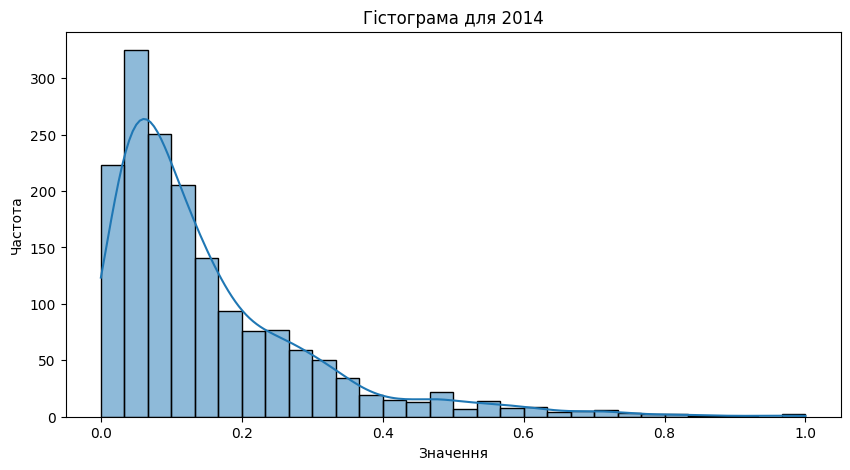

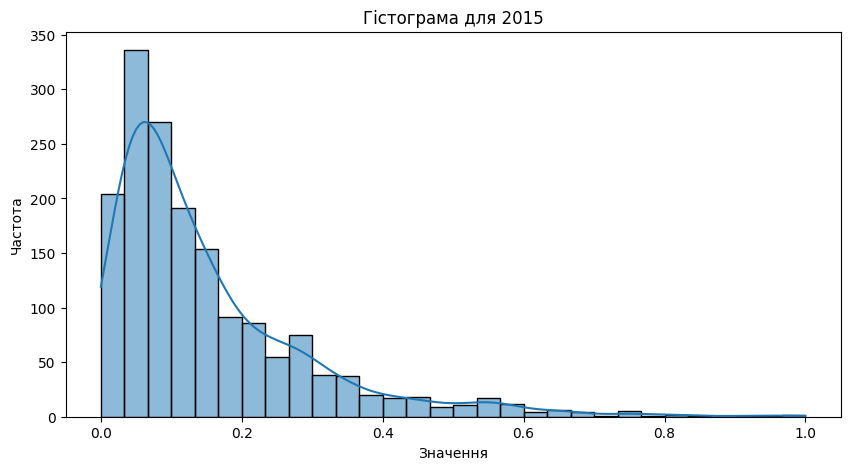

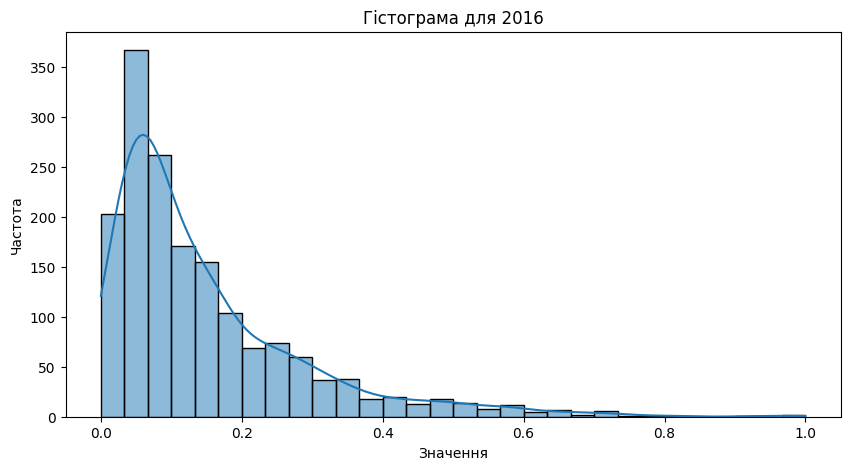

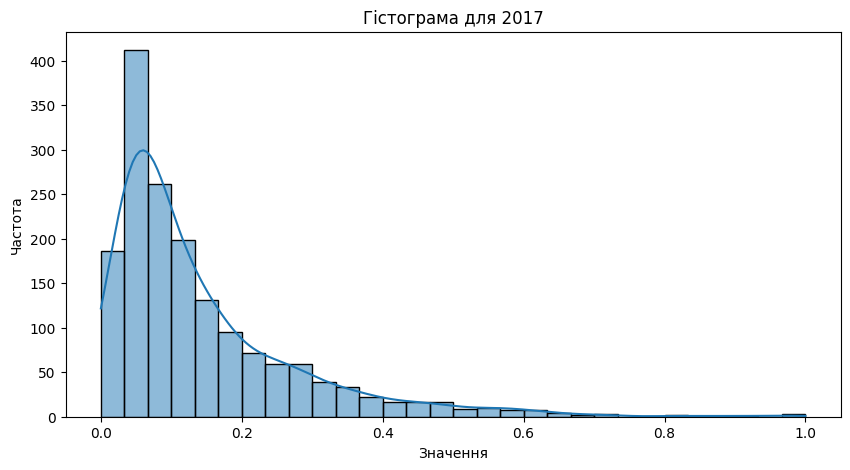

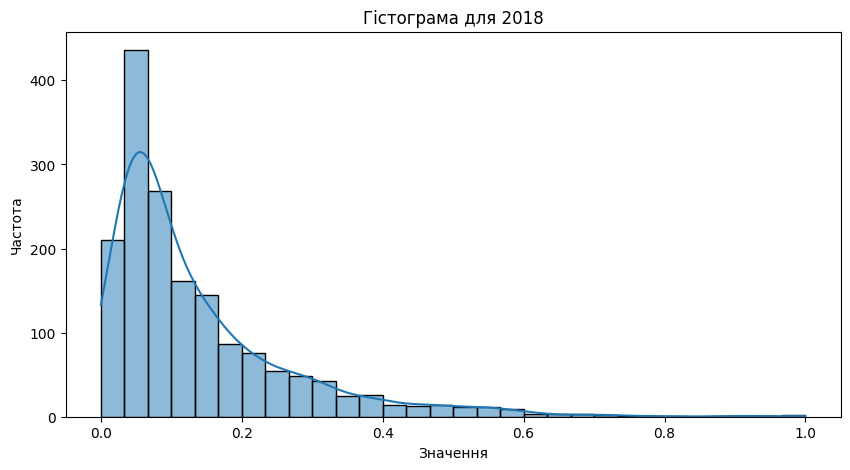

...

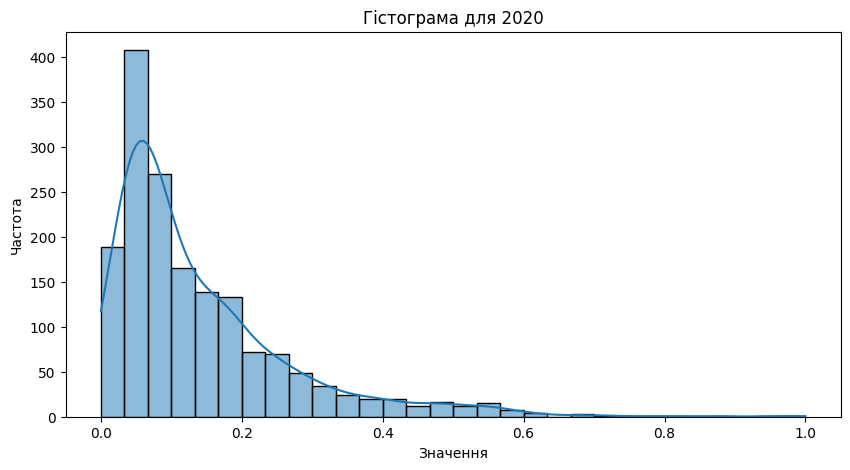

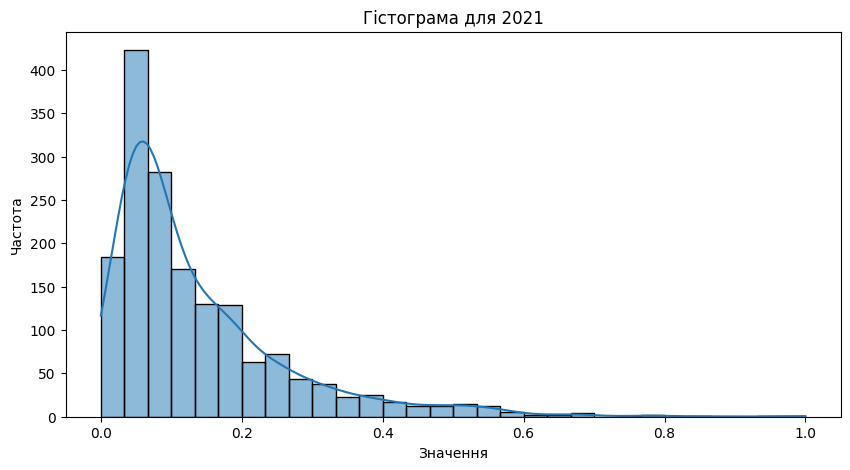

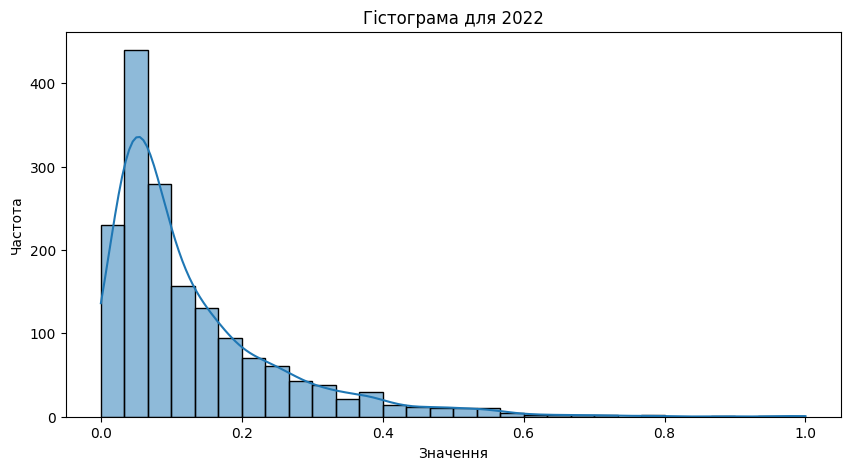

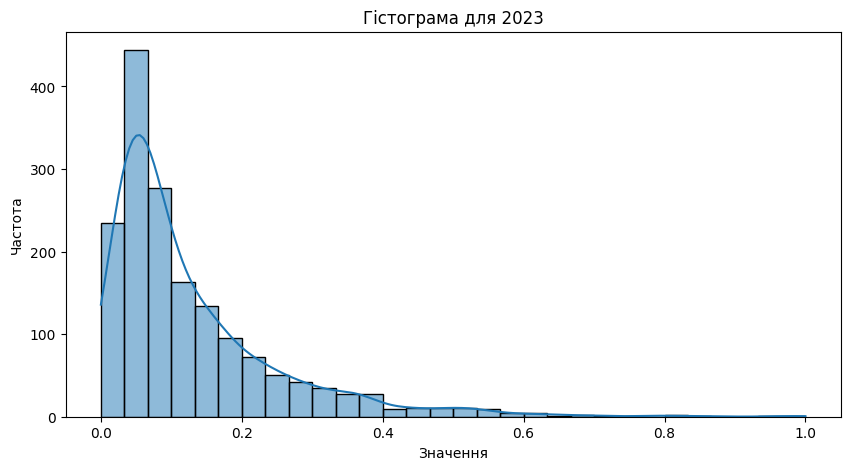

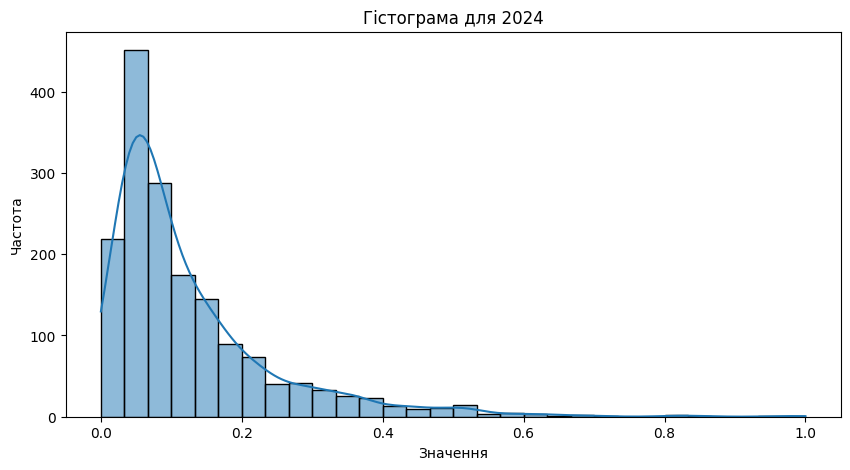

In [ ]:
for year in range(2014, 2025):
    plt.figure(figsize=(10, 5))
    sns.histplot(df_balanced[str(year)], bins=30, kde=True)
    plt.title(f'Гістограма для {year}')
    plt.xlabel('Значення')
    plt.ylabel('Частота')
    plt.show()


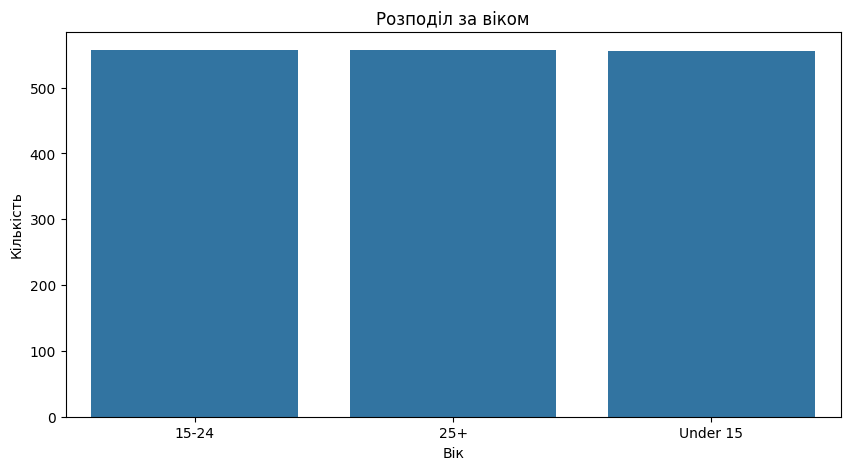

In [ ]:
plt.figure(figsize=(10, 5))
sns.countplot(x='Age', data=df_balanced)
plt.title('Розподіл за віком')
plt.xlabel('Вік')
plt.ylabel('Кількість')
plt.show()

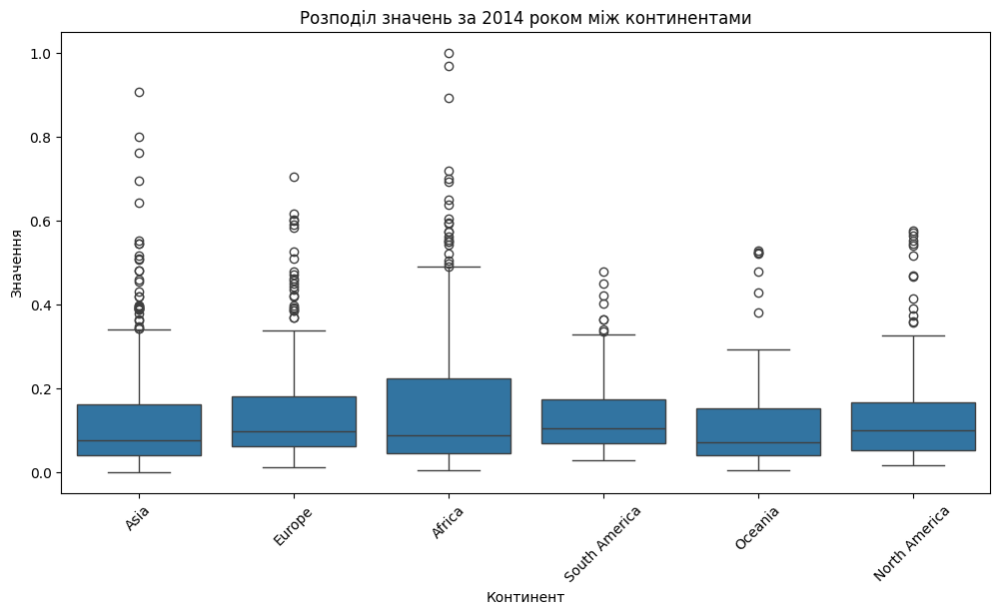

In [ ]:
plt.figure(figsize=(12, 6))
sns.boxplot(x='Continent', y='2018', data=df_balanced)
plt.title('Розподіл значень за 2014 роком між континентами')
plt.xlabel('Континент')
plt.ylabel('Значення')
plt.xticks(rotation=45)
plt.show()

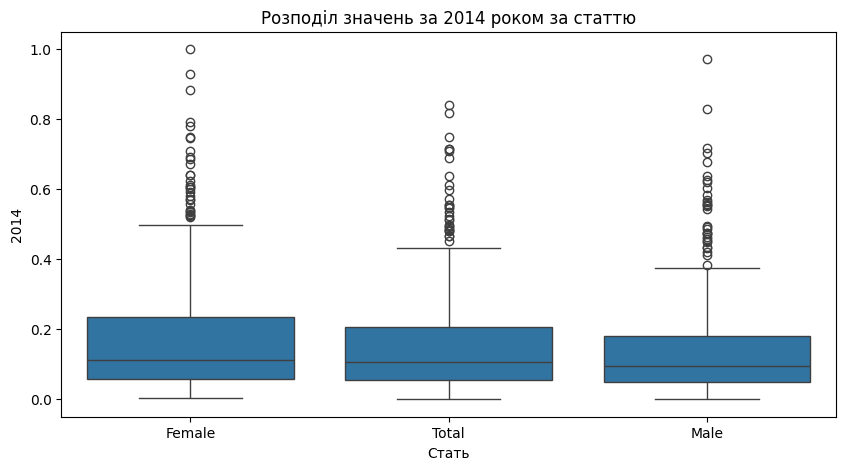

In [ ]:
plt.figure(figsize=(10, 5))
sns.boxplot(x='Sex', y='2014', data=df_balanced)
plt.title('Розподіл значень за 2014 роком за статтю')
plt.xlabel('Стать')
plt.ylabel('2014')
plt.show()

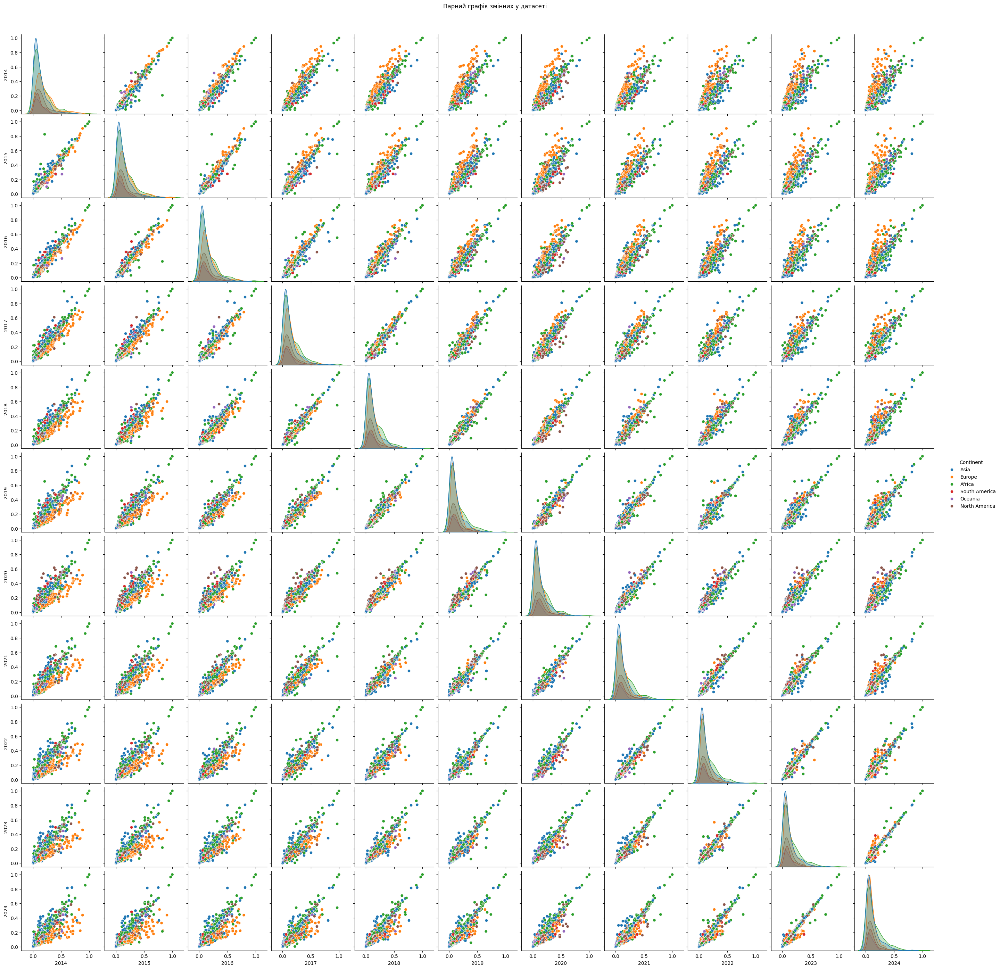

In [ ]:
sns.pairplot(df_balanced, hue='Continent', diag_kind='kde', markers='o')
plt.suptitle('Парний графік змінних у датасеті', y=1.02)
plt.show()


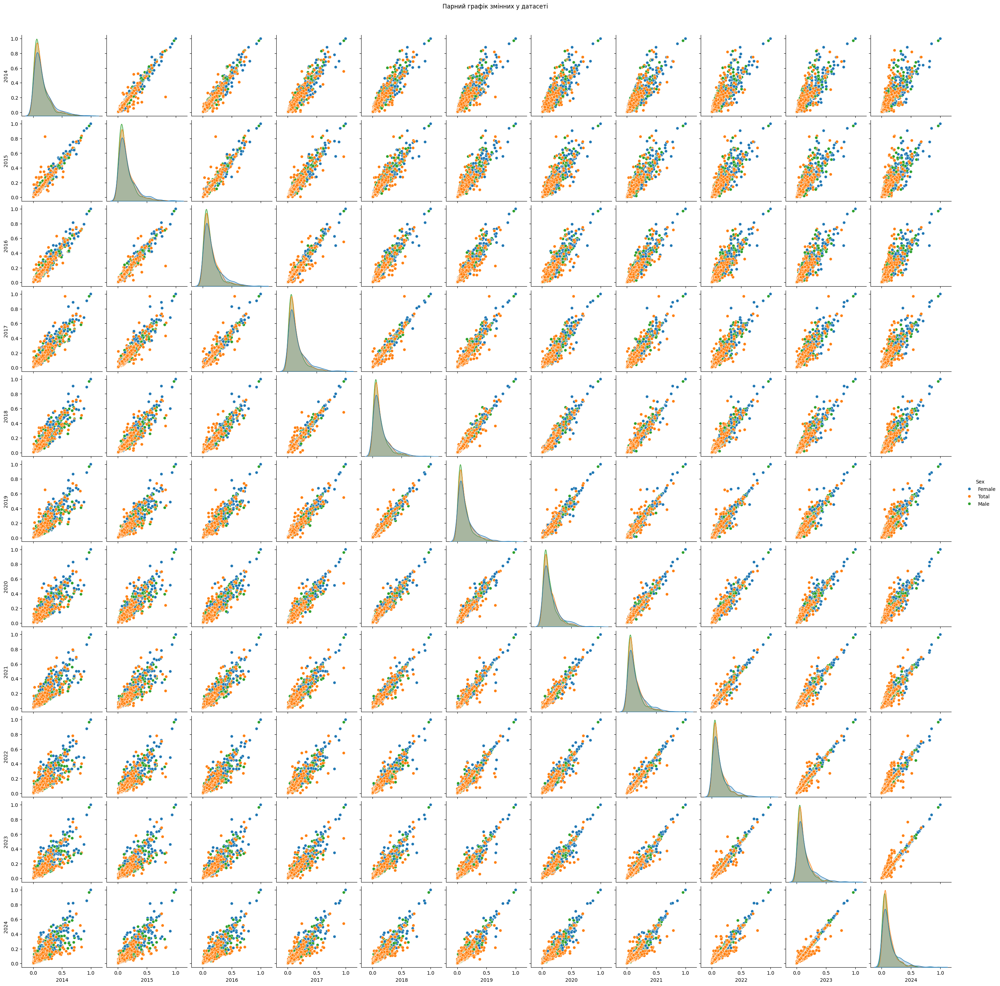

In [ ]:
sns.pairplot(df_balanced, hue='Sex', diag_kind='kde', markers='o')
plt.suptitle('Парний графік змінних у датасеті', y=1.02)
plt.show()

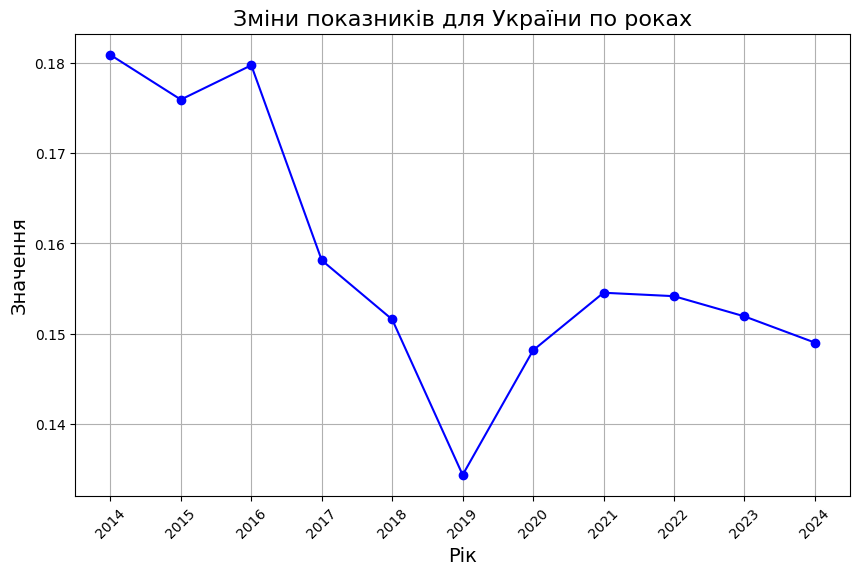

In [ ]:
df_ukraine = df_balanced[df_balanced['Country'] == 'Ukraine']
values = df_ukraine[numeric].mean()

plt.figure(figsize=(10, 6))
plt.plot(numeric, values, marker='o', linestyle='-', color='b')
plt.title('Зміни показників для України по роках', fontsize=16)
plt.xlabel('Рік', fontsize=14)
plt.ylabel('Значення', fontsize=14)
plt.grid(True)
plt.xticks(rotation=45)
plt.show()


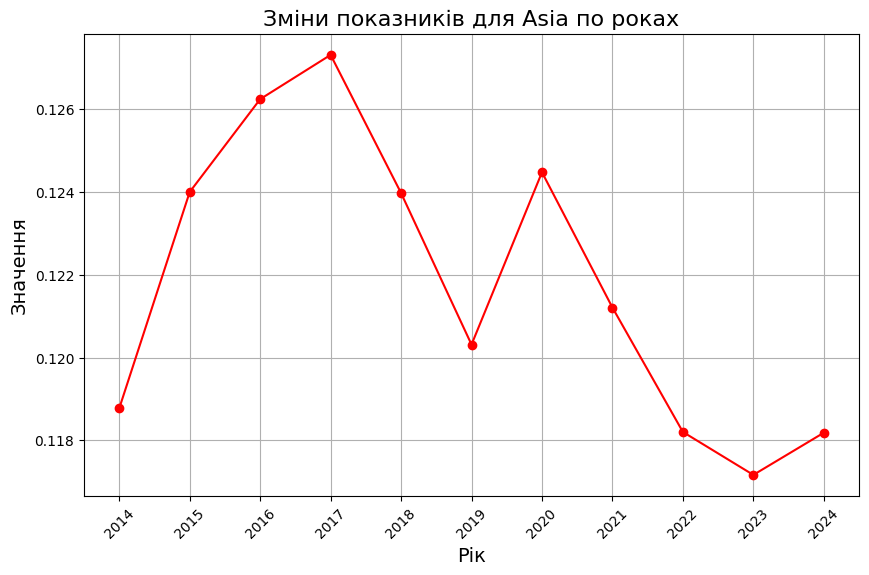

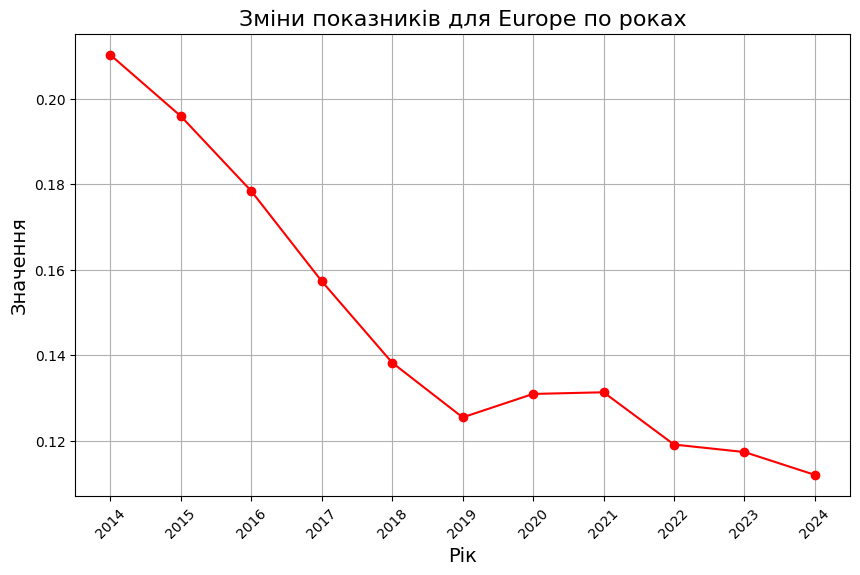

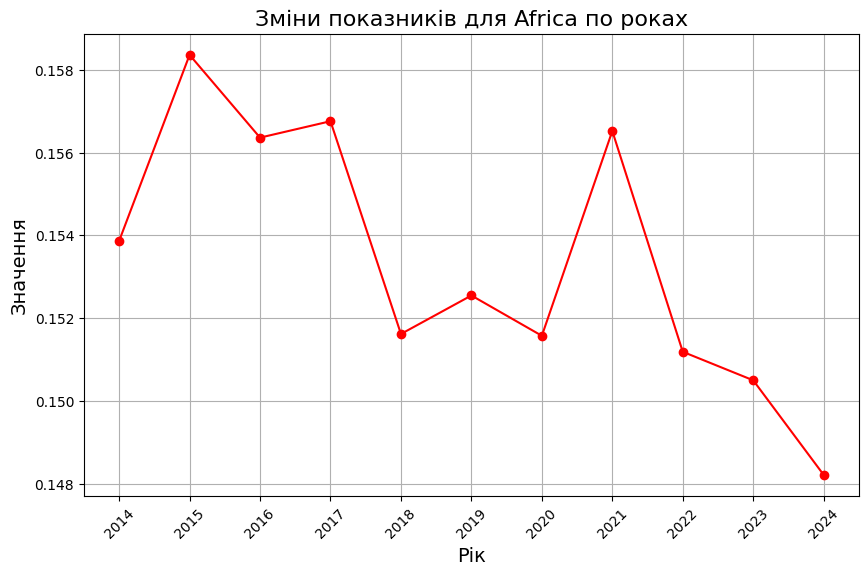

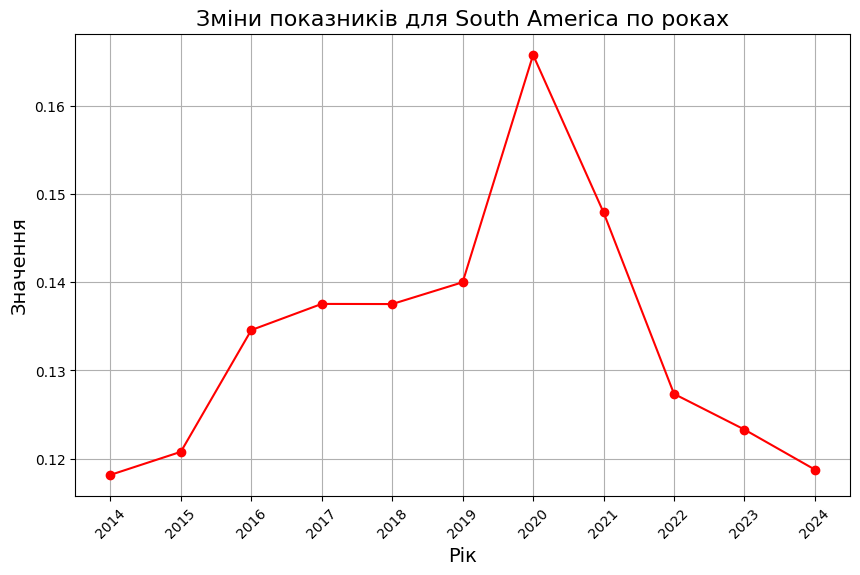

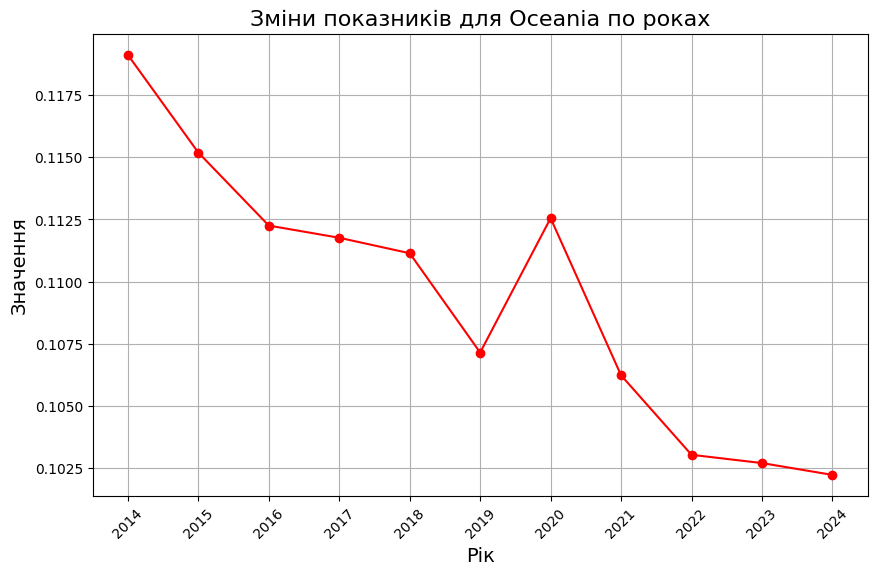

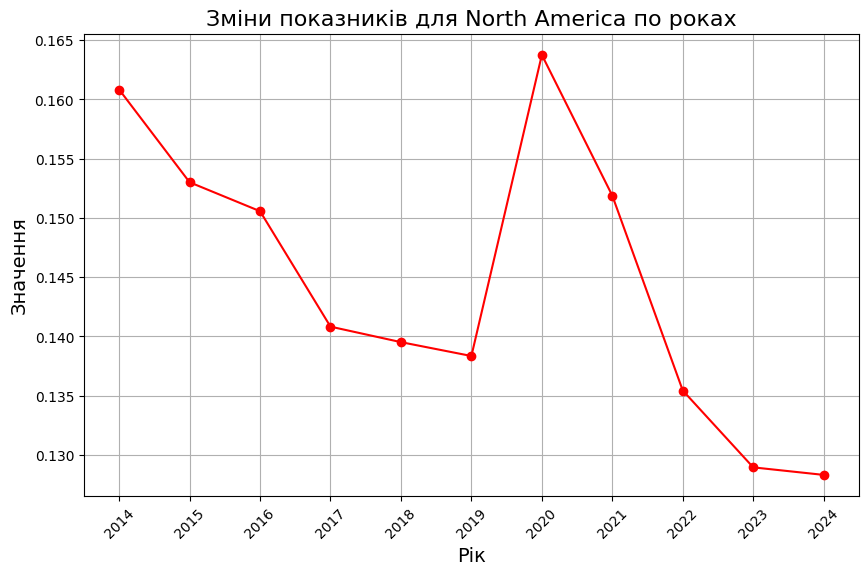

In [ ]:
continents = df_balanced['Continent'].unique()

for continent in continents:
    df_continent = df_balanced[df_balanced['Continent'] == continent]
    values = df_continent[numeric].mean()

    plt.figure(figsize=(10, 6))
    plt.plot(numeric, values, marker='o', linestyle='-', color='r')
    plt.title(f'Зміни показників для {continent} по роках', fontsize=16)
    plt.xlabel('Рік', fontsize=14)
    plt.ylabel('Значення', fontsize=14)
    plt.grid(True)
    plt.xticks(rotation=45)
    plt.show()


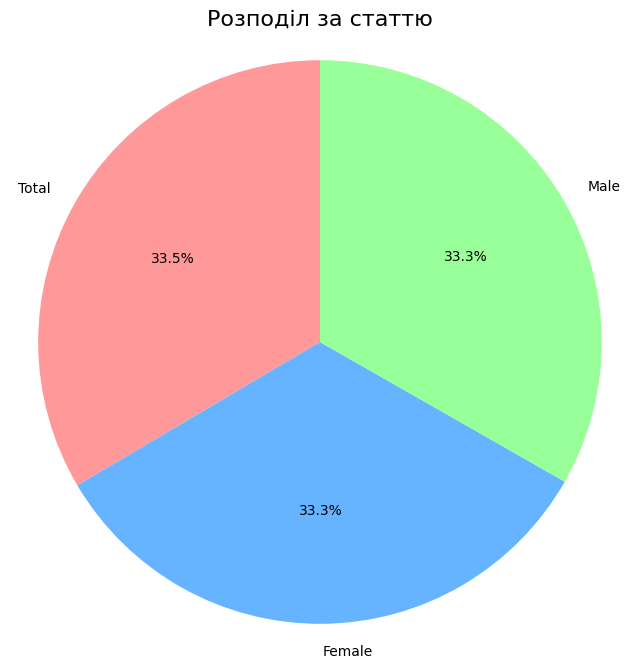

In [ ]:
sex_counts = df_balanced['Sex'].value_counts()
plt.figure(figsize=(8, 8))
plt.pie(sex_counts, labels=sex_counts.index, autopct='%1.1f%%', startangle=90, colors=['#ff9999','#66b3ff','#99ff99'])
plt.title('Розподіл за статтю', fontsize=16)

plt.axis('equal')
plt.show()


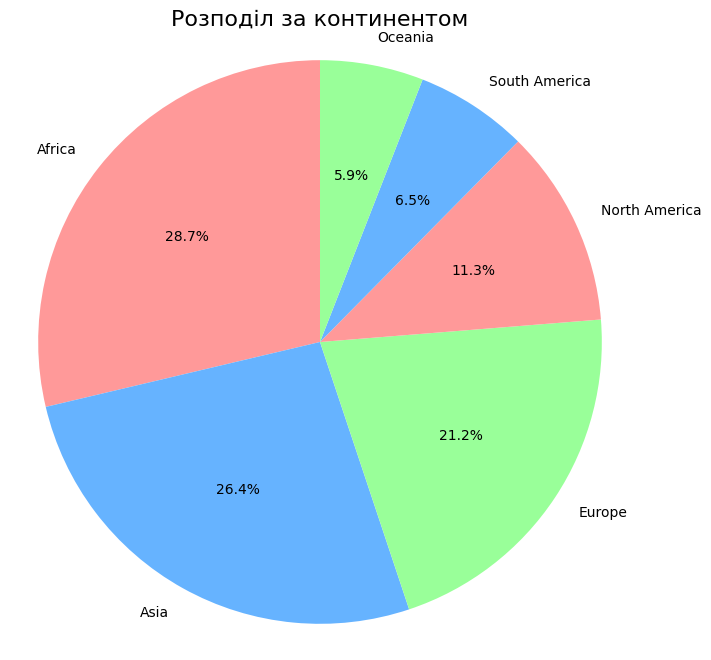

In [ ]:
cont_counts = df_balanced['Continent'].value_counts()
plt.figure(figsize=(8, 8))
plt.pie(cont_counts, labels=cont_counts.index, autopct='%1.1f%%', startangle=90, colors=['#ff9999','#66b3ff','#99ff99'])
plt.title('Розподіл за континентом', fontsize=16)

plt.axis('equal')
plt.show()


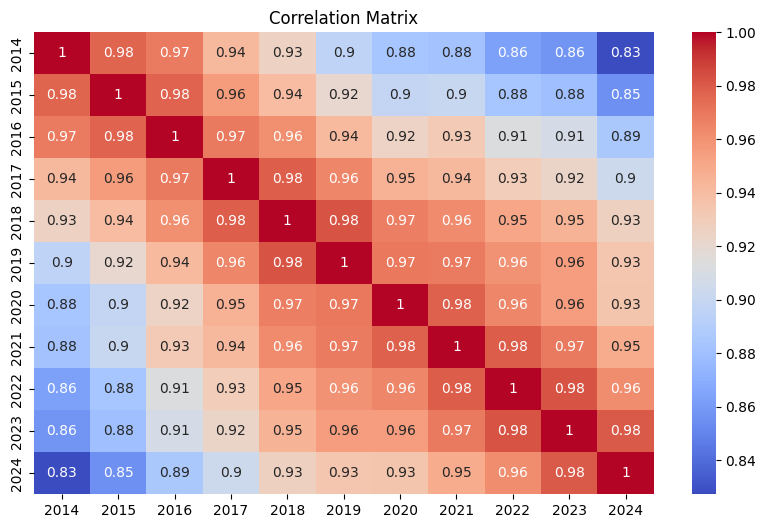

In [ ]:
numeric = df_balanced.select_dtypes(include='number').columns
correlation_matrix = df_balanced[numeric].corr()

plt.figure(figsize=(10, 6))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm')
plt.title('Correlation Matrix')
plt.show()

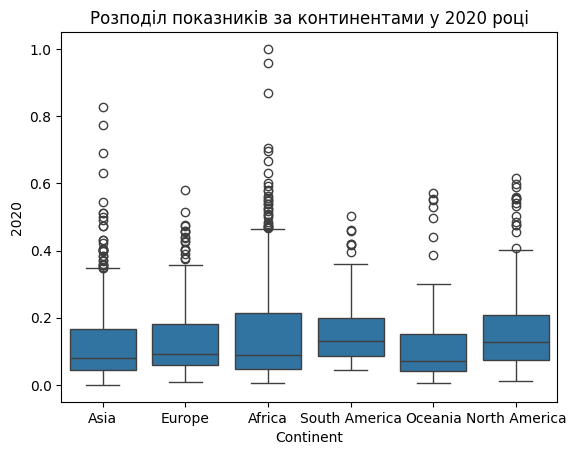

In [ ]:
sns.boxplot(x='Continent', y='2020', data=df_balanced)
plt.title('Розподіл показників за континентами у 2020 році')
plt.show()


In [ ]:
df_balanced

,Country,Sex,Age,age_categories,2014,2015,2016,2017,2018,2019,2020,2021,2022,2023,2024,Continent
0,Afghanistan,Female,15-24,Youth,0.178799,0.213613,0.248145,0.279938,0.269872,0.260809,0.252246,0.262894,0.387427,0.409503,0.423394,Asia
1,Afghanistan,Total,25+,Adults,0.090601,0.140872,0.158514,0.109882,0.173504,0.173274,0.115996,0.054246,0.258134,0.281304,0.297726,Asia
2,Afghanistan,Male,Under 15,Children,0.098216,0.111510,0.124849,0.136971,0.132192,0.128265,0.123931,0.132885,0.166474,0.182828,0.193882,Asia
3,Afghanistan,Male,25+,Adults,0.086438,0.091730,0.097252,0.102055,0.102016,0.102739,0.103367,0.111306,0.143440,0.156273,0.165772,Asia
4,Afghanistan,Total,15-24,Youth,0.133444,0.140872,0.158514,0.232671,0.173504,0.173274,0.192342,0.106249,0.258134,0.281304,0.297726,Asia
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1664,Vanuatu,Total,Under 15,Children,0.070066,0.071341,0.071503,0.071411,0.071034,0.072054,0.047680,0.058236,0.067337,0.067694,0.067177,Oceania
1665,Venezuela,Total,Under 15,Children,0.092650,0.082068,0.070927,0.068485,0.073326,0.077784,0.089886,0.087296,0.071999,0.076091,0.069104,South America
1666,Yemen,Total,Under 15,Children,0.258132,0.312157,0.318644,0.318316,0.301823,0.294580,0.280875,0.293666,0.295023,0.294446,0.292127,Asia
1667,Zambia,Total,Under 15,Children,0.109142,0.111617,0.112765,0.113006,0.065369,0.070958,0.071669,0.063031,0.055623,0.053818,0.053020,Africa


In [ ]:
data = pd.merge(combined_df, countries_continent, on="Country", how="left")

data

,Age,Sex,Country,Unemployment Rate (%),Year,Month,Continent
0,25+,Female,Ireland,0.096000,2014,04,Europe
1,25+,Total,Norway,0.028000,2014,10,Europe
2,25+,Male,Iceland,0.052000,2021,01,Europe
3,25+,Male,Iceland,0.049000,2021,02,Europe
4,25+,Male,Iceland,0.048000,2021,03,Europe
...,...,...,...,...,...,...,...
30822,25+,Total,United States of America,0.058255,2014,01,NaN
30823,15-24,Male,United States of America,0.164923,2014,01,NaN
30824,25+,Male,United States of America,0.062145,2014,01,NaN
30825,15-24,Female,United States of America,0.133269,2014,01,NaN


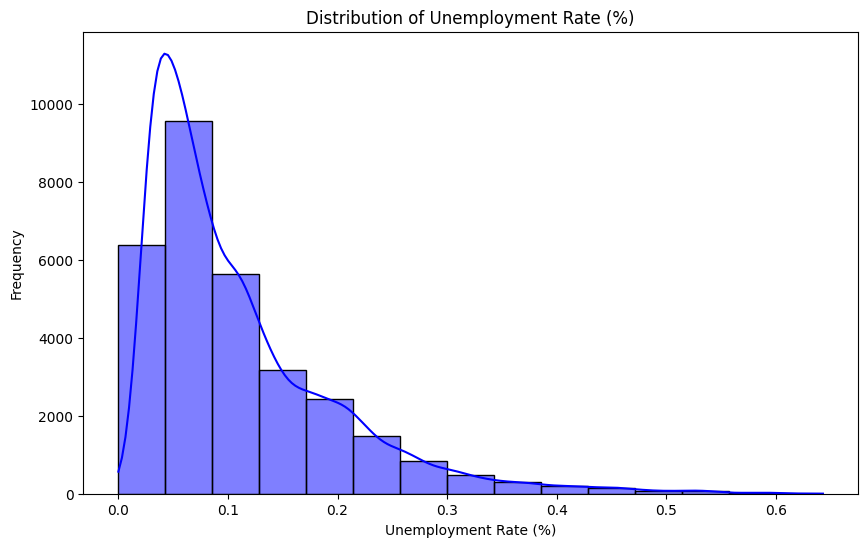

In [ ]:
data['Date'] = pd.to_datetime(data['Year'].astype(str) + '-' + data['Month'].astype(str), format='%Y-%m')

plt.figure(figsize=(10, 6))
sns.histplot(data['Unemployment Rate (%)'], bins=15, kde=True, color='blue')
plt.title('Distribution of Unemployment Rate (%)')
plt.xlabel('Unemployment Rate (%)')
plt.ylabel('Frequency')
plt.show()

In [ ]:
plt.figure(figsize=(12, 6))
sns.boxplot(x='Age', y='Unemployment Rate (%)', hue='Sex', data=data)
plt.title('Unemployment Rate by Age Group and Sex')
plt.xlabel('Age Group')
plt.ylabel('Unemployment Rate (%)')
plt.legend(title='Sex')
plt.show()

<ipython-input-122-09dcdb5f78a1>:3: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




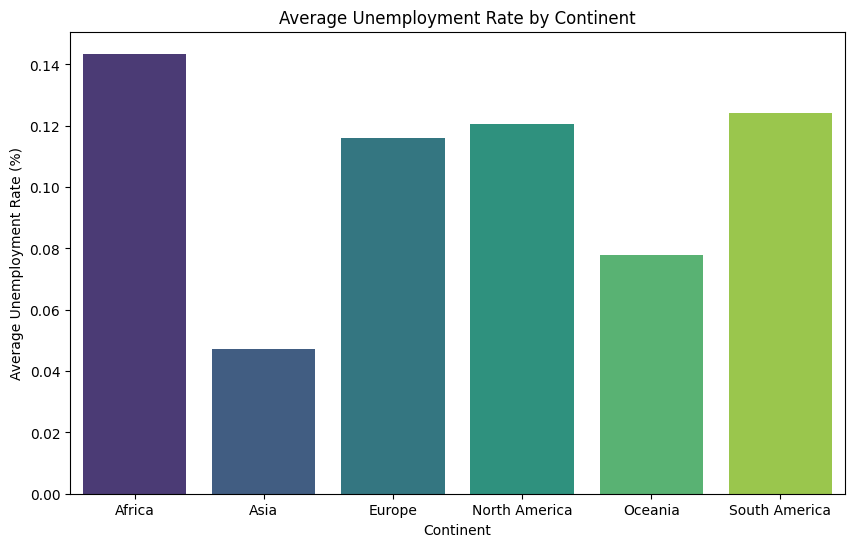

In [ ]:
plt.figure(figsize=(10, 6))
continent_avg = data.groupby('Continent')['Unemployment Rate (%)'].mean().reset_index()
sns.barplot(data=continent_avg, x='Continent', y='Unemployment Rate (%)', palette='viridis')
plt.title('Average Unemployment Rate by Continent')
plt.xlabel('Continent')
plt.ylabel('Average Unemployment Rate (%)')
plt.show()

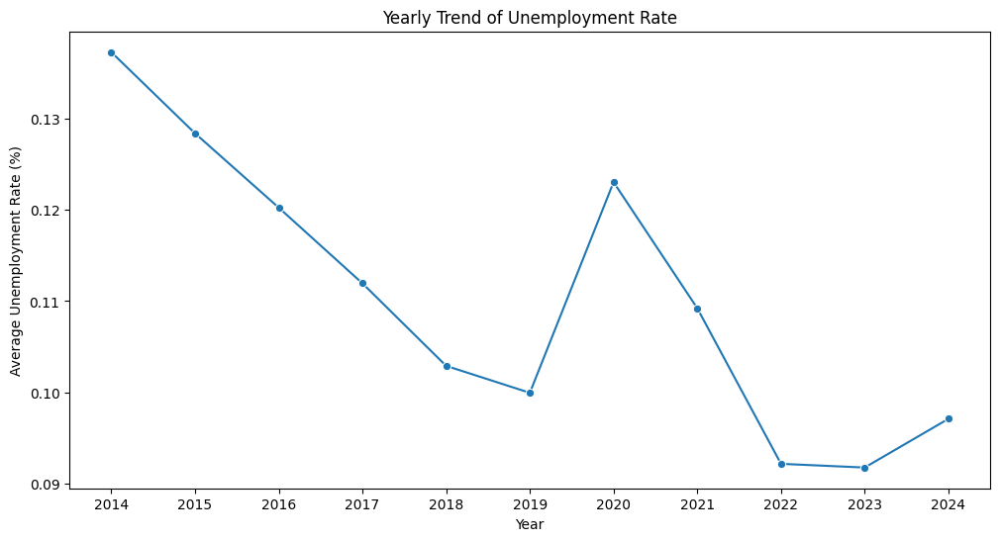

In [ ]:
plt.figure(figsize=(12, 6))
yearly_avg = data.groupby('Year')['Unemployment Rate (%)'].mean().reset_index()
sns.lineplot(data=yearly_avg, x='Year', y='Unemployment Rate (%)', marker='o')
plt.title('Yearly Trend of Unemployment Rate')
plt.xlabel('Year')
plt.ylabel('Average Unemployment Rate (%)')
plt.show()

<ipython-input-124-730d28a05cf5>:3: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




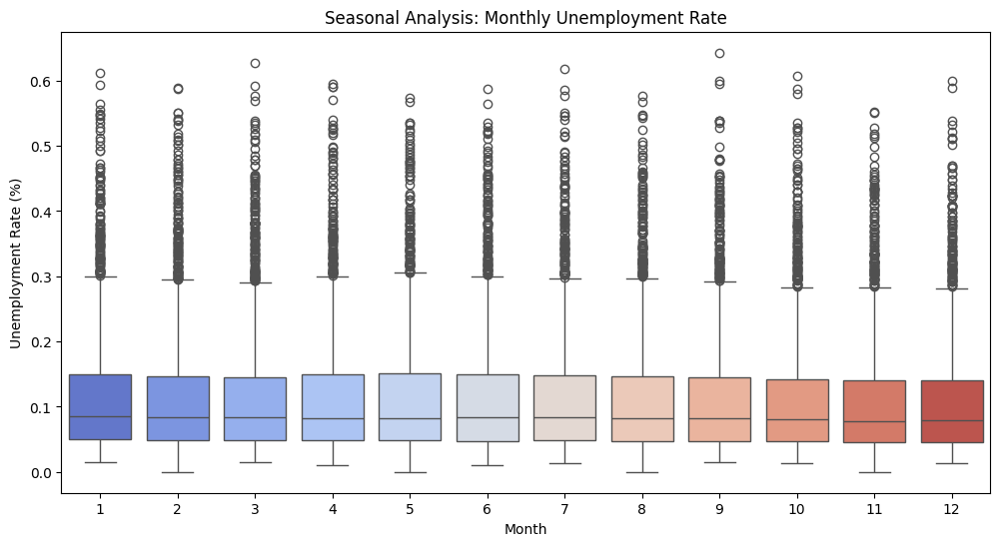

In [ ]:
data['Month'] = data['Date'].dt.month
plt.figure(figsize=(12, 6))
sns.boxplot(data=data, x='Month', y='Unemployment Rate (%)', palette='coolwarm')
plt.title('Seasonal Analysis: Monthly Unemployment Rate')
plt.xlabel('Month')
plt.ylabel('Unemployment Rate (%)')
plt.show()

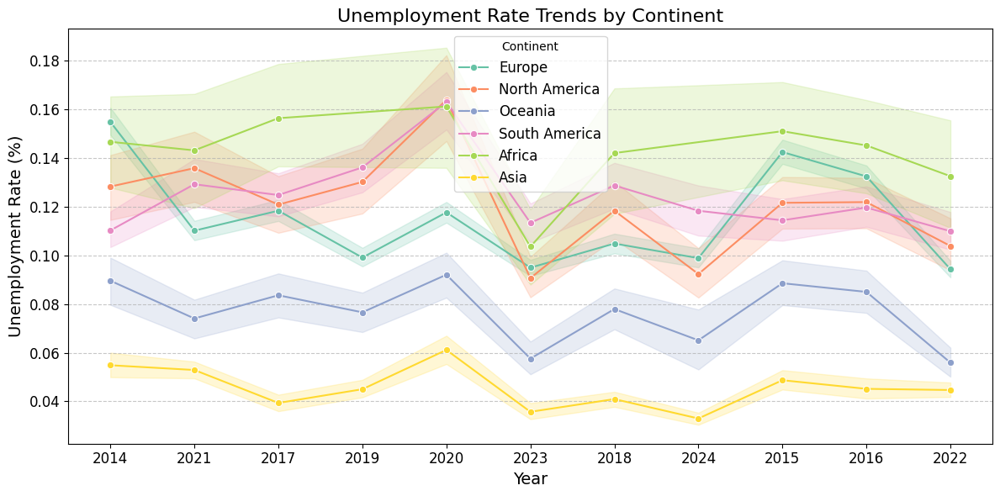

In [ ]:
plt.figure(figsize=(12, 6))
sns.lineplot(data=data, x='Year', y='Unemployment Rate (%)', hue='Continent', marker='o', palette="Set2")
plt.title('Unemployment Rate Trends by Continent', fontsize=16)
plt.xlabel('Year', fontsize=14)
plt.ylabel('Unemployment Rate (%)', fontsize=14)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.legend(title='Continent', fontsize=12)
plt.grid(axis='y', linestyle='--', alpha=0.7)

plt.tight_layout()
plt.show()

<ipython-input-136-e55404d3e25d>:4: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




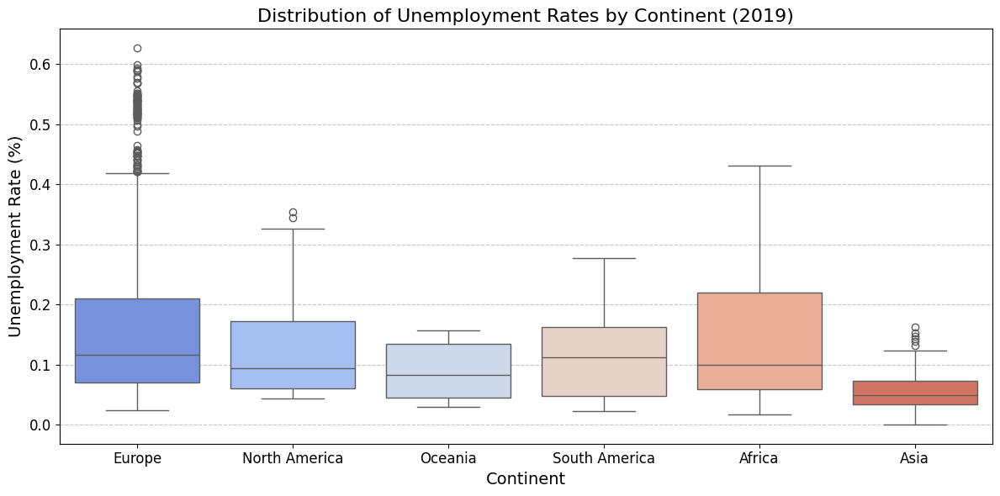

In [ ]:
data_2014 = data[data['Year'] == '2014']

plt.figure(figsize=(12, 6))
sns.boxplot(data=data_2014, x='Continent', y='Unemployment Rate (%)', palette="coolwarm")

plt.title('Distribution of Unemployment Rates by Continent (2019)', fontsize=16)
plt.xlabel('Continent', fontsize=14)
plt.ylabel('Unemployment Rate (%)', fontsize=14)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.grid(axis='y', linestyle='--', alpha=0.7)

plt.tight_layout()
plt.show()


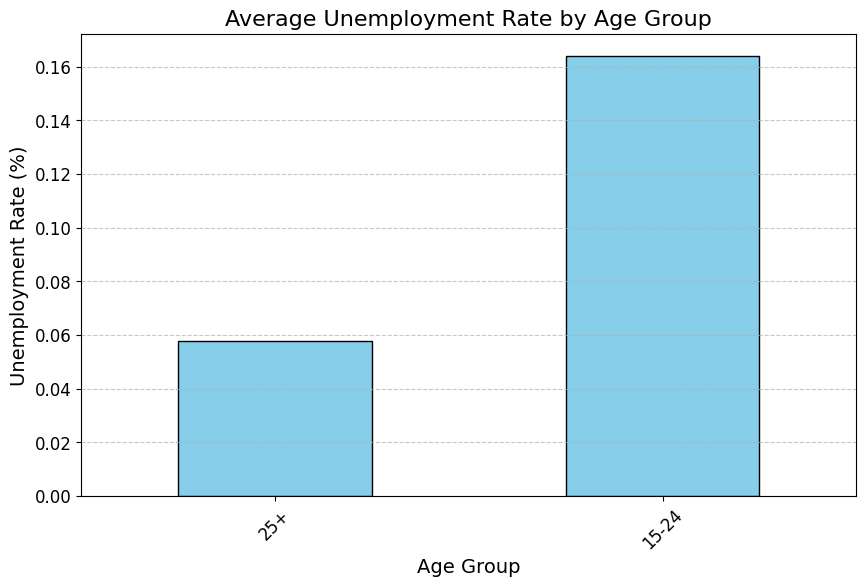

In [ ]:
age_group_avg = data.groupby('Age')['Unemployment Rate (%)'].mean().sort_values()

plt.figure(figsize=(10, 6))
age_group_avg.plot(kind='bar', color='skyblue', edgecolor='black')
plt.title('Average Unemployment Rate by Age Group', fontsize=16)
plt.xlabel('Age Group', fontsize=14)
plt.ylabel('Unemployment Rate (%)', fontsize=14)
plt.xticks(rotation=45, fontsize=12)
plt.yticks(fontsize=12)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()


<ipython-input-134-6c2d267779a3>:2: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




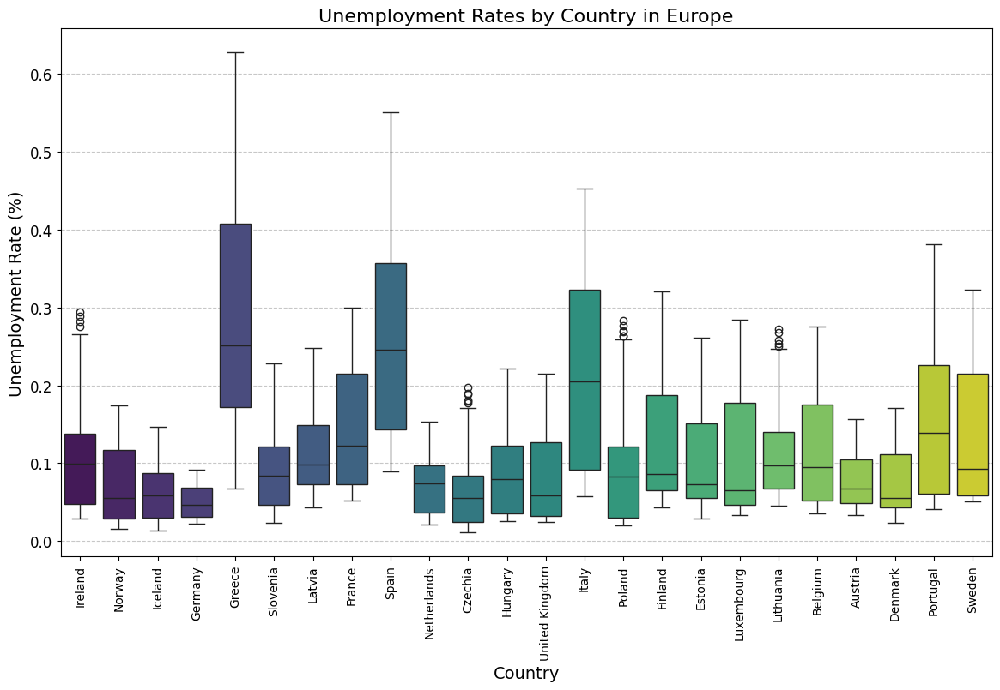

In [ ]:
plt.figure(figsize=(14, 8))
sns.boxplot(data=data[data['Continent'] == 'Europe'], x='Country', y='Unemployment Rate (%)', palette='viridis')
plt.title('Unemployment Rates by Country in Europe', fontsize=16)
plt.xlabel('Country', fontsize=14)
plt.ylabel('Unemployment Rate (%)', fontsize=14)
plt.xticks(rotation=90, fontsize=10)
plt.yticks(fontsize=12)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()
